# 1) Imports

#### PyTorch

In [1]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, OneCycleLR

In [2]:
print('PyTorch version', torch.__version__)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)

PyTorch version 2.9.1+cu128
Device: cuda


#### General

In [3]:
import os
import json
import math
import time
import random
from pathlib import Path
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from tqdm import tqdm

from sklearn.metrics import roc_auc_score

#### Monai

In [4]:
import monai
print("MONAI version:", monai.__version__)

/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


MONAI version: 1.5.1


In [16]:
from monai.networks.nets import UNet as MonaiUNet
from monai.losses import DiceCELoss
from monai.utils import set_determinism
from monai.transforms import (
    Compose,
    ScaleIntensityd,
    RandFlipd,
    RandRotated,
    RandAffined,
    Resized,
    EnsureTyped,
    EnsureChannelFirstd,
    EnsureChannelFirstd,
)

# 2) Parameters

#### 2.1) Directories

In [17]:
chase_root = Path("/home/usrs/hnoel/CHASE_DB1")

train_images_dir = chase_root / "Train" / "Images"
val_images_dir   = chase_root / "Val"   / "Images"
test_images_dir  = chase_root / "Test"  / "Images"

# Choix du GT (option A) : 1st_manual
train_manual_dir = chase_root / "Train" / "GroundTruth" / "1st_manual"
val_manual_dir   = chase_root / "Val"   / "GroundTruth" / "1st_manual"
test_manual_dir  = chase_root / "Test"  / "GroundTruth" / "1st_manual"

#### 2.2) Hyperparameters

In [18]:
# Image sizes
IMG_HEIGHT = 960
IMG_WIDTH  = 960

# Batch size
BATCH_SIZE = 6

# Number of epochs
EPOCHS = 300

# Learning rate
LR = 1e-3

# Classes
NUM_CLASSES = 2
BACKGROUND_IDX = 0
VESSEL_CLASS = 1

#### 2.3) Seed

In [19]:
SEED = 42

# Python
random.seed(SEED)

# NumPy
np.random.seed(SEED)

# PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Monai
set_determinism(seed=SEED)

print(f"Seed fixed to {SEED}")

Seed fixed to 42


#### 2.4) Save directories

In [20]:
model_name = "UNet_CHASE_DB1_v1"

# Courbes, JSON, figures, etc.
data_dir = Path("/home/usrs/hnoel/Tohoku/Monai/UNet") / model_name
data_dir.mkdir(parents=True, exist_ok=True)

# Poids de modèles
models_dir = Path("/home/usrs/hnoel/MODELS/UNet") / model_name
models_dir.mkdir(parents=True, exist_ok=True)

# 3) DataLoaders

#### 3.1) Data augmentation

In [21]:
from monai.transforms import (
    Compose,
    ScaleIntensityd,
    RandFlipd,
    RandRotated,
    RandAffined,
    Resized,
    EnsureTyped,
    EnsureChannelFirstd,
)
import numpy as np

final_size = (IMG_HEIGHT, IMG_WIDTH)   # (960, 960)

train_transforms = Compose([
    # ---- FORMAT ----
    EnsureChannelFirstd(keys=["image"], channel_dim=-1),          # HWC -> CHW
    EnsureChannelFirstd(keys=["label"], channel_dim="no_channel"),# HW  -> 1HW

    ScaleIntensityd(keys=["image"]),

    RandFlipd(keys=["image", "label"], spatial_axis=0, prob=0.6),
    RandFlipd(keys=["image", "label"], spatial_axis=1, prob=0.6),

    RandRotated(
        keys=["image", "label"],
        range_x=np.pi / 8,
        prob=0.3,
        mode=("bilinear", "nearest"),
    ),

    RandAffined(
        keys=["image", "label"],
        prob=0.3,
        rotate_range=(-np.pi / 12, np.pi / 12),
        translate_range=(20, 20),
        scale_range=(0.05, 0.05),
        mode=("bilinear", "nearest"),
    ),

    Resized(
        keys=["image", "label"],
        spatial_size=final_size,
        mode=("bilinear", "nearest"),
    ),

    EnsureTyped(keys=["image", "label"]),
])

val_transforms = Compose([
    EnsureChannelFirstd(keys=["image"], channel_dim=-1),
    EnsureChannelFirstd(keys=["label"], channel_dim="no_channel"),

    ScaleIntensityd(keys=["image"]),

    Resized(
        keys=["image", "label"],
        spatial_size=final_size,
        mode=("bilinear", "nearest"),
    ),

    EnsureTyped(keys=["image", "label"]),
])


#### 3.2) Create the class fot the CHASE datset images

In [ ]:
class ChaseDataset(Dataset):
    """
    CHASE_DB1 layout expected:
      <split>/Images/*.png                     e.g. Image_01R.png, Image_01L.png
      <split>/GroundTruth/1st_manual/*.png     e.g. Image_01R_1stHO.png
      <split>/GroundTruth/2nd_manual/*.png     (optional)

    This dataset matches masks by name:
      mask_name = f"{img_stem}_1stHO.png"
    where img_stem is e.g. "Image_01R".
    """
    def __init__(
        self,
        img_dir,
        manual_dir,
        img_size=(960, 960),
        transforms=None,
        image_glob="*.png",
        mask_suffix="_1stHO.png",
    ):
        self.img_dir = Path(img_dir)
        self.manual_dir = Path(manual_dir)
        self.H, self.W = img_size
        self.transforms = transforms
        self.mask_suffix = mask_suffix

        self.img_paths = sorted(self.img_dir.glob(image_glob))
        if len(self.img_paths) == 0:
            raise FileNotFoundError(f"No images found in: {self.img_dir}")

        # Build mask map based on expected suffix convention
        # key: img_stem -> mask_path
        self.mask_map = {}
        for p in sorted(self.manual_dir.glob("*.png")):
            # expected: Image_01R_1stHO.png -> stem: Image_01R_1stHO
            # we want the base stem: Image_01R
            name = p.name
            if name.endswith(mask_suffix):
                base = name[: -len(mask_suffix)]  # "Image_01R"
                self.mask_map[base] = p

        # Validate that every image has a mask
        missing = []
        for ip in self.img_paths:
            if ip.stem not in self.mask_map:
                missing.append(ip.name)
        if missing:
            raise FileNotFoundError(
                "Some images have no matching mask in manual_dir.\n"
                f"manual_dir={self.manual_dir}\n"
                f"Missing (first 10): {missing[:10]}"
            )

    def __len__(self):
        return len(self.img_paths)

    def _load_rgb(self, path: Path) -> np.ndarray:
        img = Image.open(path).convert("RGB")
        if (img.size[1], img.size[0]) != (self.H, self.W):  # PIL size is (W,H)
            img = img.resize((self.W, self.H), resample=Image.BILINEAR)
        arr = np.asarray(img, dtype=np.uint8).copy()  # (H,W,3)
        return arr

    def _load_mask01(self, path: Path) -> np.ndarray:
        m = Image.open(path).convert("L")
        if (m.size[1], m.size[0]) != (self.H, self.W):
            m = m.resize((self.W, self.H), resample=Image.NEAREST)
        arr = np.asarray(m, dtype=np.uint8).copy()  # (H,W)
        # binarize: CHASE masks are typically 0/255, but robust to grayscale
        arr = (arr > 0).astype(np.uint8)     # 0/1
        return arr

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        mask_path = self.mask_map[img_path.stem]

        image = self._load_rgb(img_path)     # (H,W,3) uint8
        mask  = self._load_mask01(mask_path) # (H,W)   0/1 uint8

        # If you're using MONAI transforms that expect dicts:
        sample = {"image": image, "label": mask}

        if self.transforms is not None:
            sample = self.transforms(sample)

        # Ensure torch tensors with channel-first
        # If transforms already did it, these are no-ops or can be removed.
        if isinstance(sample["image"], np.ndarray):
            sample["image"] = torch.from_numpy(sample["image"]).permute(2, 0, 1).float() / 255.0
        if isinstance(sample["label"], np.ndarray):
            sample["label"] = torch.from_numpy(sample["label"]).unsqueeze(0).long()

        return sample

In [23]:
# ---- Datasets ----
train_ds = ChaseDataset(
    img_dir=train_images_dir,
    manual_dir=train_manual_dir,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    transforms=train_transforms,  # keep your notebook's transforms
    mask_suffix="_1stHO.png",
)

val_ds = ChaseDataset(
    img_dir=val_images_dir,
    manual_dir=val_manual_dir,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    transforms=val_transforms,
    mask_suffix="_1stHO.png",
)

test_ds = ChaseDataset(
    img_dir=test_images_dir,
    manual_dir=test_manual_dir,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    transforms=val_transforms,
    mask_suffix="_1stHO.png",
)

print("CHASE sizes (expected): Train=10 (L) / Val=4 (L) / Test=14 (R)")
print("Actual:", len(train_ds), len(val_ds), len(test_ds))

# ---- Loaders ----
from torch.utils.data import DataLoader

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ---- Sanity check ----
batch = next(iter(train_loader))
print("image:", batch["image"].shape, batch["image"].dtype)
print("label:", batch["label"].shape, batch["label"].dtype, "unique:", torch.unique(batch["label"]))


CHASE sizes (expected): Train=10 (L) / Val=4 (L) / Test=14 (R)
Actual: 10 4 14


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

image: torch.Size([6, 3, 960, 960]) torch.float32
label: torch.Size([6, 1, 960, 960]) torch.float32 unique: metatensor([0., 1.])


# 4) UNet Model

In [24]:
model = MonaiUNet(
    spatial_dims=2,                             # UNet in 2D
    in_channels=3,                              # images RGB => 3 channels
    out_channels=NUM_CLASSES,                   # 2 classes : background + vessels
    channels=(64, 128, 256, 512, 1024),         # number of feature channels at each level
    strides=(2, 2, 2, 2),                       # 4 steps of downsampling (implicite max-pool 2x2)
    kernel_size=3,                              # conv 3x3
    up_kernel_size=3,                           # up-conv 3x3
    num_res_units=0,                            # no residual units -> simple blocs conv+ReLU
    act="RELU",                                 # Use ReLU, defaults is PReLU 
    norm="instance",                                  # no normalization in the 2015 article
    dropout=0.0,                                # No dropout here
).to(device)

In [25]:
print(model.__class__.__name__, "initialized on", device)

UNet initialized on cuda


# 5) Optimizer

In [26]:
optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    betas=(0.9, 0.999),
    eps=1e-8,
    weight_decay=1e-2
    )

# 6) Scheduler

In [27]:
scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=50,   # tous les 50 epochs
    gamma=0.5       # LR = LR * 0.5
)

# 7) Loss function

In [28]:
# Pour DRIVE (binaire), on commence sans pondération explicite des classes.
# Si besoin, on pourra recalculer des poids plus tard à partir des fréquences de pixels.
weights = None

In [29]:
loss_function = DiceCELoss(
    include_background=False,   # on ne compte pas le background dans le Dice
    to_onehot_y=True,
    softmax=True,
    weight=weights,
    lambda_dice=1.0,
    lambda_ce=1.0,
)

# 8) History and metrics

In [30]:
best_val_loss = float("inf")
best_val_dice = -float("inf")

In [31]:
# ===========================================
#   DICTIONNAIRES STOCRAGE (MEAN ONLY)
# ===========================================

train_history = {
    "loss": [],
    "accuracy":   [],
    "dice":       [],
    "iou":        [],
    "precision":  [],
    "recall":     [],
    "sensitivity":[],
    "specificity":[],
    "auc":        [],
    "lr":         [],
    "alpha":      []
}

val_history = {
    "loss": [],
    "accuracy":   [],
    "dice":       [],
    "iou":        [],
    "precision":  [],
    "recall":     [],
    "sensitivity":[],
    "specificity":[],
    "auc":        []
}

In [32]:
def init_confmat_sums(num_classes=NUM_CLASSES):
    """
    Agrégats TP/FP/FN/TN sur l'ensemble du dataset.
    N = nombre de pixels pris en compte (dans le FOV).
    """
    sums = {
        "TP": np.zeros(num_classes, dtype=np.int64),
        "FP": np.zeros(num_classes, dtype=np.int64),
        "FN": np.zeros(num_classes, dtype=np.int64),
        "TN": np.zeros(num_classes, dtype=np.int64),
        "N":  0,
    }
    return sums

In [33]:
def init_auc_buffers(classes):
    """
    Buffers pour stocker y_true / y_score par classe (liste d'indices de classes).
    Exemple : classes = [VESSEL_CLASS].
    """
    buffers = {}
    for c in classes:
        buffers[c] = {"y_true": [], "y_score": []}
    return buffers

In [34]:
def update_confmat_sums(sums, preds, targets, num_classes=NUM_CLASSES, fov=None):
    """
    Mets à jour TP/FP/FN/TN en tenant compte éventuellement du FOV.
    - preds   : (B,H,W)
    - targets : (B,H,W) ou (B,1,H,W)
    - fov     : (B,H,W) ou (B,1,H,W), bool ou {0,1}; si None => tout le carré
    """
    with torch.no_grad():
        # Harmonisation des shapes
        if targets.dim() == 4:
            targets = targets.squeeze(1)          # (B,H,W)
        if fov is not None and fov.dim() == 4:
            fov = fov.squeeze(1)                  # (B,H,W)

        # Masque FOV binaire, si fourni
        if fov is not None:
            f = fov.bool()
        else:
            f = None

        for c in range(num_classes):
            p = (preds == c)
            t = (targets == c)

            if f is not None:
                p = p & f
                t = t & f

            tp = (p & t).sum().item()
            fp = (p & ~t).sum().item()
            fn = (~p & t).sum().item()
            tn = (~p & ~t).sum().item()

            sums["TP"][c] += tp
            sums["FP"][c] += fp
            sums["FN"][c] += fn
            sums["TN"][c] += tn

        if f is not None:
            sums["N"] += f.sum().item()
        else:
            sums["N"] += targets.numel()

In [35]:
def update_auc_buffers(buffers, logits, targets, fov=None):
    """
    Mets à jour les buffers pour AUC.
    - logits : (B,C,H,W)
    - targets: (B,H,W) ou (B,1,H,W)
    - fov    : (B,H,W) ou (B,1,H,W), bool ou {0,1}; si None => tout le carré
    """
    with torch.no_grad():
        if targets.dim() == 4:
            targets = targets.squeeze(1)          # (B,H,W)
        if fov is not None and fov.dim() == 4:
            fov = fov.squeeze(1)                  # (B,H,W)

        probs = F.softmax(logits, dim=1)          # (B,C,H,W)
        B, C, H, W = probs.shape

        # aplatir
        flat_probs = probs.permute(0, 2, 3, 1).reshape(-1, C)  # (B*H*W, C)
        flat_t     = targets.reshape(-1)                       # (B*H*W,)

        if fov is not None:
            flat_f = fov.reshape(-1).bool()
            flat_probs = flat_probs[flat_f]
            flat_t     = flat_t[flat_f]

        for c, pack in buffers.items():
            y_true  = (flat_t == c).cpu().numpy().astype(np.uint8)
            y_score = flat_probs[:, c].cpu().numpy()

            # cas dégénérés : pas de pos ou pas de neg => AUC non définie
            pos = (y_true == 1).sum()
            neg = (y_true == 0).sum()
            if pos == 0 or neg == 0:
                continue

            pack["y_true"].append(y_true)
            pack["y_score"].append(y_score)

In [36]:
def compute_scalar_metrics_from_confmat(sums, include_classes):
    """
    Calcule accuracy / precision / recall / specificity / dice / IoU
    en moyenne sur les classes listées (ex: [VESSEL_CLASS]).
    """
    TP, FP, FN, TN = sums["TP"], sums["FP"], sums["FN"], sums["TN"]
    eps = 1e-7

    acc_c  = (TP + TN) / np.maximum(TP + TN + FP + FN, eps)
    prec_c = TP / np.maximum(TP + FP, eps)
    rec_c  = TP / np.maximum(TP + FN, eps)
    spec_c = TN / np.maximum(TN + FP, eps)
    dice_c = (2 * TP) / np.maximum(2 * TP + FP + FN, eps)
    iou_c  = TP / np.maximum(TP + FP + FN, eps)

    idx = np.array(include_classes, dtype=int)
    return {
        "accuracy":    float(np.mean(acc_c[idx])),
        "precision":   float(np.mean(prec_c[idx])),
        "recall":      float(np.mean(rec_c[idx])),
        "specificity": float(np.mean(spec_c[idx])),
        "dice":        float(np.mean(dice_c[idx])),
        "iou":         float(np.mean(iou_c[idx])),
    }

In [37]:
def compute_mean_auc(buffers):
    """
    Calcule l'AUC moyen en moyennant sur les classes présentes dans `buffers`.
    """
    aucs = []
    for c, pack in buffers.items():
        if len(pack["y_true"]) == 0:
            continue
        y_true  = np.concatenate(pack["y_true"])
        y_score = np.concatenate(pack["y_score"])

        pos = (y_true == 1).sum()
        neg = (y_true == 0).sum()
        if pos == 0 or neg == 0:
            continue

        try:
            aucs.append(roc_auc_score(y_true, y_score))
        except Exception:
            pass

    if len(aucs) == 0:
        return float("nan")
    return float(np.mean(aucs))

# 9) Training

In [39]:
for epoch in range(EPOCHS):

    # =========================
    #        TRAIN
    # =========================
    model.train()

    running_loss = 0.0
    conf_sums = init_confmat_sums()
    auc_buf   = init_auc_buffers([VESSEL_CLASS])

    for batch in train_loader:

        imgs   = batch["image"].to(device, non_blocking=True)
        labels = batch["label"].to(device, non_blocking=True)  # (B,1,H,W)

        optimizer.zero_grad()

        outputs = model(imgs)         # (B,C,H,W)
        loss    = loss_function(outputs, labels)  # loss attend (B,1,H,W)

        loss.backward()
        optimizer.step()

        batch_size = imgs.size(0)
        running_loss += loss.item() * batch_size

        # ---- MÉTRIQUES DANS LE FOV UNIQUEMENT ----
        preds   = outputs.argmax(dim=1)          # (B,H,W)
        targets = labels.squeeze(1)              # (B,H,W)

        update_confmat_sums(conf_sums, preds, targets, NUM_CLASSES)
        update_auc_buffers(auc_buf, outputs, targets)

    train_loss   = running_loss / len(train_ds)
    train_metrics = compute_scalar_metrics_from_confmat(conf_sums, [VESSEL_CLASS])
    train_auc     = compute_mean_auc(auc_buf)

    current_lr = optimizer.param_groups[0]["lr"]

    train_history["loss"].append(train_loss)
    train_history["accuracy"].append(train_metrics["accuracy"])
    train_history["dice"].append(train_metrics["dice"])
    train_history["iou"].append(train_metrics["iou"])
    train_history["precision"].append(train_metrics["precision"])
    train_history["recall"].append(train_metrics["recall"])
    train_history["specificity"].append(train_metrics["specificity"])
    train_history["auc"].append(train_auc)
    train_history["lr"].append(current_lr)

    # =========================
    #       VALIDATION
    # =========================
    model.eval()

    val_running_loss = 0.0
    conf_sums_val = init_confmat_sums()
    auc_buf_val   = init_auc_buffers(classes=[VESSEL_CLASS])

    with torch.no_grad():
        for batch in val_loader:

            imgs   = batch["image"].to(device, non_blocking=True)
            labels = batch["label"].to(device, non_blocking=True)

            outputs = model(imgs)
            loss    = loss_function(outputs, labels)

            batch_size = imgs.size(0)
            val_running_loss += loss.item() * batch_size

            preds   = outputs.argmax(dim=1)
            targets = labels.squeeze(1)

            update_confmat_sums(conf_sums_val, preds, targets, NUM_CLASSES)
            update_auc_buffers(auc_buf_val, outputs, targets)

    val_loss    = val_running_loss / len(val_ds)
    val_metrics = compute_scalar_metrics_from_confmat(conf_sums_val, [VESSEL_CLASS])
    val_auc     = compute_mean_auc(auc_buf_val)

    val_history["loss"].append(val_loss)
    val_history["accuracy"].append(val_metrics["accuracy"])
    val_history["dice"].append(val_metrics["dice"])
    val_history["iou"].append(val_metrics["iou"])
    val_history["precision"].append(val_metrics["precision"])
    val_history["recall"].append(val_metrics["recall"])
    val_history["specificity"].append(val_metrics["specificity"])
    val_history["auc"].append(val_auc)

    # =========================
    #        LOGS
    # =========================
    print("-" * 40)
    print(f"Epoch {epoch+1}/{EPOCHS}")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Val   Loss: {val_loss:.4f}")
    print(f"  Train Dice: {train_metrics['dice']:.4f} | Val Dice: {val_metrics['dice']:.4f}")
    print(f"  Current LR: {current_lr:.6f}")

    # =========================
    #   SAVE BEST MODELS
    # =========================
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), str(models_dir / "loss_best_model_state_dict.pth"))
        torch.save(model,              str(models_dir / "loss_best_model_full.pth"))
        print("✅ New best model (loss) saved")

    if val_metrics["dice"] > best_val_dice:
        best_val_dice = val_metrics["dice"]
        torch.save(model.state_dict(), str(models_dir / "dice_best_model_state_dict.pth"))
        torch.save(model,              str(models_dir / "dice_best_model_full.pth"))
        print("✅ New best model (dice) saved")

    # =========================
    #   SCHEDULER STEP
    # =========================
    scheduler.step()

# =========================
#     SAVE LAST MODEL
# =========================
torch.save(model.state_dict(), str(models_dir / f"epoch{EPOCHS}_model_state_dict.pth"))
torch.save(model,              str(models_dir / f"epoch{EPOCHS}_model_full.pth"))
print("✅ Last model saved")


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)


----------------------------------------
Epoch 1/300
  Train Loss: 1.4658
  Val   Loss: 1.2303
  Train Dice: 0.1440 | Val Dice: 0.1774
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 2/300
  Train Loss: 1.2118
  Val   Loss: 1.1390
  Train Dice: 0.1637 | Val Dice: 0.1389
  Current LR: 0.001000
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 3/300
  Train Loss: 1.1290
  Val   Loss: 1.0897
  Train Dice: 0.1276 | Val Dice: 0.1568
  Current LR: 0.001000
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 4/300
  Train Loss: 1.0795
  Val   Loss: 1.0564
  Train Dice: 0.1509 | Val Dice: 0.2107
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 5/300
  Train Loss: 1.0427
  Val   Loss: 1.0213
  Train Dice: 0.2138 | Val Dice: 0.2517
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 6/300
  Train Loss: 0.9994
  Val   Loss: 0.9532
  Train Dice: 0.2728 | Val Dice: 0.3200
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 7/300
  Train Loss: 0.9373
  Val   Loss: 0.9181
  Train Dice: 0.3705 | Val Dice: 0.3888
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 8/300
  Train Loss: 0.8971
  Val   Loss: 0.8363
  Train Dice: 0.4121 | Val Dice: 0.4762
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 9/300
  Train Loss: 0.8293
  Val   Loss: 0.7584
  Train Dice: 0.4789 | Val Dice: 0.5493
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 10/300
  Train Loss: 0.7668
  Val   Loss: 0.7648
  Train Dice: 0.5351 | Val Dice: 0.4868
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 11/300
  Train Loss: 0.7489
  Val   Loss: 0.6657
  Train Dice: 0.5189 | Val Dice: 0.6206
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 12/300
  Train Loss: 0.6784
  Val   Loss: 0.6301
  Train Dice: 0.6048 | Val Dice: 0.6256
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 13/300
  Train Loss: 0.6400
  Val   Loss: 0.6184
  Train Dice: 0.6146 | Val Dice: 0.6448
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 14/300
  Train Loss: 0.6241
  Val   Loss: 0.5807
  Train Dice: 0.6332 | Val Dice: 0.6483
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 15/300
  Train Loss: 0.5942
  Val   Loss: 0.5347
  Train Dice: 0.6411 | Val Dice: 0.6836
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 16/300
  Train Loss: 0.5462
  Val   Loss: 0.5373
  Train Dice: 0.6724 | Val Dice: 0.6892
  Current LR: 0.001000
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 17/300
  Train Loss: 0.5411
  Val   Loss: 0.5378
  Train Dice: 0.6775 | Val Dice: 0.6681
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 18/300
  Train Loss: 0.5470
  Val   Loss: 0.4907
  Train Dice: 0.6575 | Val Dice: 0.7061
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 19/300
  Train Loss: 0.5107
  Val   Loss: 0.4918
  Train Dice: 0.6856 | Val Dice: 0.7053
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 20/300
  Train Loss: 0.5050
  Val   Loss: 0.4850
  Train Dice: 0.6888 | Val Dice: 0.7076
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 21/300
  Train Loss: 0.4948
  Val   Loss: 0.4678
  Train Dice: 0.6914 | Val Dice: 0.7194
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 22/300
  Train Loss: 0.4810
  Val   Loss: 0.4586
  Train Dice: 0.7023 | Val Dice: 0.7275
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 23/300
  Train Loss: 0.4745
  Val   Loss: 0.4688
  Train Dice: 0.7075 | Val Dice: 0.7136
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 24/300
  Train Loss: 0.4808
  Val   Loss: 0.4674
  Train Dice: 0.6973 | Val Dice: 0.7156
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 25/300
  Train Loss: 0.4730
  Val   Loss: 0.4705
  Train Dice: 0.7052 | Val Dice: 0.7083
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 26/300
  Train Loss: 0.4772
  Val   Loss: 0.4453
  Train Dice: 0.6964 | Val Dice: 0.7310
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 27/300
  Train Loss: 0.4553
  Val   Loss: 0.4429
  Train Dice: 0.7163 | Val Dice: 0.7307
  Current LR: 0.001000
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 28/300
  Train Loss: 0.4520
  Val   Loss: 0.4380
  Train Dice: 0.7143 | Val Dice: 0.7318
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 29/300
  Train Loss: 0.4463
  Val   Loss: 0.4484
  Train Dice: 0.7205 | Val Dice: 0.7285
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 30/300
  Train Loss: 0.4445
  Val   Loss: 0.4262
  Train Dice: 0.7231 | Val Dice: 0.7378
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 31/300
  Train Loss: 0.4402
  Val   Loss: 0.4240
  Train Dice: 0.7210 | Val Dice: 0.7408
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 32/300
  Train Loss: 0.4321
  Val   Loss: 0.4308
  Train Dice: 0.7255 | Val Dice: 0.7387
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 33/300
  Train Loss: 0.4261
  Val   Loss: 0.4187
  Train Dice: 0.7346 | Val Dice: 0.7481
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 34/300
  Train Loss: 0.4230
  Val   Loss: 0.4164
  Train Dice: 0.7355 | Val Dice: 0.7444
  Current LR: 0.001000
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 35/300
  Train Loss: 0.4180
  Val   Loss: 0.4176
  Train Dice: 0.7344 | Val Dice: 0.7435
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 36/300
  Train Loss: 0.4153
  Val   Loss: 0.4055
  Train Dice: 0.7380 | Val Dice: 0.7516
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 37/300
  Train Loss: 0.4098
  Val   Loss: 0.4188
  Train Dice: 0.7414 | Val Dice: 0.7429
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 38/300
  Train Loss: 0.4180
  Val   Loss: 0.4119
  Train Dice: 0.7365 | Val Dice: 0.7481
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 39/300
  Train Loss: 0.4101
  Val   Loss: 0.4660
  Train Dice: 0.7409 | Val Dice: 0.7142
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 40/300
  Train Loss: 0.4336
  Val   Loss: 0.4300
  Train Dice: 0.7260 | Val Dice: 0.7360
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 41/300
  Train Loss: 0.4355
  Val   Loss: 0.4347
  Train Dice: 0.7241 | Val Dice: 0.7341
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 42/300
  Train Loss: 0.4225
  Val   Loss: 0.3945
  Train Dice: 0.7331 | Val Dice: 0.7587
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 43/300
  Train Loss: 0.4113
  Val   Loss: 0.3987
  Train Dice: 0.7394 | Val Dice: 0.7587
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 44/300
  Train Loss: 0.4115
  Val   Loss: 0.4038
  Train Dice: 0.7398 | Val Dice: 0.7535
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 45/300
  Train Loss: 0.4076
  Val   Loss: 0.3974
  Train Dice: 0.7426 | Val Dice: 0.7581
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 46/300
  Train Loss: 0.3994
  Val   Loss: 0.3946
  Train Dice: 0.7477 | Val Dice: 0.7585
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 47/300
  Train Loss: 0.3958
  Val   Loss: 0.3933
  Train Dice: 0.7505 | Val Dice: 0.7573
  Current LR: 0.001000
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 48/300
  Train Loss: 0.3898
  Val   Loss: 0.3845
  Train Dice: 0.7533 | Val Dice: 0.7652
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 49/300
  Train Loss: 0.3877
  Val   Loss: 0.3891
  Train Dice: 0.7558 | Val Dice: 0.7634
  Current LR: 0.001000


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 50/300
  Train Loss: 0.3834
  Val   Loss: 0.3817
  Train Dice: 0.7600 | Val Dice: 0.7665
  Current LR: 0.001000
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 51/300
  Train Loss: 0.3822
  Val   Loss: 0.3755
  Train Dice: 0.7574 | Val Dice: 0.7712
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 52/300
  Train Loss: 0.3788
  Val   Loss: 0.3810
  Train Dice: 0.7623 | Val Dice: 0.7671
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 53/300
  Train Loss: 0.3768
  Val   Loss: 0.3719
  Train Dice: 0.7616 | Val Dice: 0.7717
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 54/300
  Train Loss: 0.3742
  Val   Loss: 0.3671
  Train Dice: 0.7633 | Val Dice: 0.7768
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 55/300
  Train Loss: 0.3745
  Val   Loss: 0.3714
  Train Dice: 0.7646 | Val Dice: 0.7718
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 56/300
  Train Loss: 0.3706
  Val   Loss: 0.3800
  Train Dice: 0.7644 | Val Dice: 0.7677
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 57/300
  Train Loss: 0.3672
  Val   Loss: 0.3667
  Train Dice: 0.7680 | Val Dice: 0.7767
  Current LR: 0.000500
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 58/300
  Train Loss: 0.3677
  Val   Loss: 0.3627
  Train Dice: 0.7676 | Val Dice: 0.7773
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 59/300
  Train Loss: 0.3641
  Val   Loss: 0.3673
  Train Dice: 0.7679 | Val Dice: 0.7765
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 60/300
  Train Loss: 0.3638
  Val   Loss: 0.3634
  Train Dice: 0.7710 | Val Dice: 0.7775
  Current LR: 0.000500
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 61/300
  Train Loss: 0.3590
  Val   Loss: 0.3647
  Train Dice: 0.7726 | Val Dice: 0.7768
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 62/300
  Train Loss: 0.3592
  Val   Loss: 0.3602
  Train Dice: 0.7734 | Val Dice: 0.7794
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 63/300
  Train Loss: 0.3567
  Val   Loss: 0.3697
  Train Dice: 0.7739 | Val Dice: 0.7732
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 64/300
  Train Loss: 0.3569
  Val   Loss: 0.3618
  Train Dice: 0.7757 | Val Dice: 0.7788
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 65/300
  Train Loss: 0.3548
  Val   Loss: 0.3569
  Train Dice: 0.7754 | Val Dice: 0.7810
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 66/300
  Train Loss: 0.3493
  Val   Loss: 0.3597
  Train Dice: 0.7799 | Val Dice: 0.7800
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 67/300
  Train Loss: 0.3505
  Val   Loss: 0.3661
  Train Dice: 0.7790 | Val Dice: 0.7754
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 68/300
  Train Loss: 0.3530
  Val   Loss: 0.3531
  Train Dice: 0.7774 | Val Dice: 0.7850
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 69/300
  Train Loss: 0.3538
  Val   Loss: 0.3660
  Train Dice: 0.7759 | Val Dice: 0.7751
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 70/300
  Train Loss: 0.3502
  Val   Loss: 0.3576
  Train Dice: 0.7789 | Val Dice: 0.7820
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 71/300
  Train Loss: 0.3500
  Val   Loss: 0.3545
  Train Dice: 0.7784 | Val Dice: 0.7827
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 72/300
  Train Loss: 0.3476
  Val   Loss: 0.3510
  Train Dice: 0.7801 | Val Dice: 0.7858
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 73/300
  Train Loss: 0.3443
  Val   Loss: 0.3534
  Train Dice: 0.7833 | Val Dice: 0.7825
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 74/300
  Train Loss: 0.3426
  Val   Loss: 0.3535
  Train Dice: 0.7834 | Val Dice: 0.7844
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 75/300
  Train Loss: 0.3387
  Val   Loss: 0.3511
  Train Dice: 0.7870 | Val Dice: 0.7841
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 76/300
  Train Loss: 0.3344
  Val   Loss: 0.3449
  Train Dice: 0.7890 | Val Dice: 0.7892
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 77/300
  Train Loss: 0.3363
  Val   Loss: 0.3501
  Train Dice: 0.7870 | Val Dice: 0.7847
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 78/300
  Train Loss: 0.3315
  Val   Loss: 0.3520
  Train Dice: 0.7919 | Val Dice: 0.7860
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 79/300
  Train Loss: 0.3331
  Val   Loss: 0.3512
  Train Dice: 0.7908 | Val Dice: 0.7833
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 80/300
  Train Loss: 0.3381
  Val   Loss: 0.3465
  Train Dice: 0.7847 | Val Dice: 0.7898
  Current LR: 0.000500
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 81/300
  Train Loss: 0.3377
  Val   Loss: 0.3507
  Train Dice: 0.7883 | Val Dice: 0.7834
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 82/300
  Train Loss: 0.3317
  Val   Loss: 0.3416
  Train Dice: 0.7889 | Val Dice: 0.7915
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 83/300
  Train Loss: 0.3327
  Val   Loss: 0.3679
  Train Dice: 0.7894 | Val Dice: 0.7742
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 84/300
  Train Loss: 0.3366
  Val   Loss: 0.3448
  Train Dice: 0.7870 | Val Dice: 0.7886
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 85/300
  Train Loss: 0.3334
  Val   Loss: 0.3492
  Train Dice: 0.7896 | Val Dice: 0.7862
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 86/300
  Train Loss: 0.3321
  Val   Loss: 0.3391
  Train Dice: 0.7907 | Val Dice: 0.7938
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 87/300
  Train Loss: 0.3283
  Val   Loss: 0.3494
  Train Dice: 0.7926 | Val Dice: 0.7863
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 88/300
  Train Loss: 0.3298
  Val   Loss: 0.3440
  Train Dice: 0.7925 | Val Dice: 0.7887
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 89/300
  Train Loss: 0.3273
  Val   Loss: 0.3393
  Train Dice: 0.7929 | Val Dice: 0.7925
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 90/300
  Train Loss: 0.3246
  Val   Loss: 0.3390
  Train Dice: 0.7957 | Val Dice: 0.7917
  Current LR: 0.000500
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 91/300
  Train Loss: 0.3218
  Val   Loss: 0.3381
  Train Dice: 0.7969 | Val Dice: 0.7920
  Current LR: 0.000500
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 92/300
  Train Loss: 0.3180
  Val   Loss: 0.3304
  Train Dice: 0.7996 | Val Dice: 0.7962
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 93/300
  Train Loss: 0.3164
  Val   Loss: 0.3372
  Train Dice: 0.7996 | Val Dice: 0.7931
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 94/300
  Train Loss: 0.3182
  Val   Loss: 0.3338
  Train Dice: 0.7999 | Val Dice: 0.7953
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 95/300
  Train Loss: 0.3198
  Val   Loss: 0.3405
  Train Dice: 0.7980 | Val Dice: 0.7920
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 96/300
  Train Loss: 0.3171
  Val   Loss: 0.3325
  Train Dice: 0.7995 | Val Dice: 0.7962
  Current LR: 0.000500
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 97/300
  Train Loss: 0.3178
  Val   Loss: 0.3306
  Train Dice: 0.7999 | Val Dice: 0.7978
  Current LR: 0.000500
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 98/300
  Train Loss: 0.3170
  Val   Loss: 0.3308
  Train Dice: 0.7989 | Val Dice: 0.7979
  Current LR: 0.000500
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 99/300
  Train Loss: 0.3144
  Val   Loss: 0.3427
  Train Dice: 0.8023 | Val Dice: 0.7900
  Current LR: 0.000500


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 100/300
  Train Loss: 0.3144
  Val   Loss: 0.3231
  Train Dice: 0.8011 | Val Dice: 0.8023
  Current LR: 0.000500
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 101/300
  Train Loss: 0.3123
  Val   Loss: 0.3238
  Train Dice: 0.8024 | Val Dice: 0.8022
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 102/300
  Train Loss: 0.3078
  Val   Loss: 0.3282
  Train Dice: 0.8059 | Val Dice: 0.7988
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 103/300
  Train Loss: 0.3022
  Val   Loss: 0.3303
  Train Dice: 0.8090 | Val Dice: 0.7977
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 104/300
  Train Loss: 0.3042
  Val   Loss: 0.3243
  Train Dice: 0.8074 | Val Dice: 0.8012
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 105/300
  Train Loss: 0.2987
  Val   Loss: 0.3232
  Train Dice: 0.8113 | Val Dice: 0.8022
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 106/300
  Train Loss: 0.2987
  Val   Loss: 0.3246
  Train Dice: 0.8121 | Val Dice: 0.8012
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 107/300
  Train Loss: 0.2998
  Val   Loss: 0.3260
  Train Dice: 0.8120 | Val Dice: 0.8000
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 108/300
  Train Loss: 0.2953
  Val   Loss: 0.3263
  Train Dice: 0.8142 | Val Dice: 0.7992
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 109/300
  Train Loss: 0.2985
  Val   Loss: 0.3258
  Train Dice: 0.8104 | Val Dice: 0.8006
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 110/300
  Train Loss: 0.2895
  Val   Loss: 0.3258
  Train Dice: 0.8177 | Val Dice: 0.8006
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 111/300
  Train Loss: 0.2912
  Val   Loss: 0.3244
  Train Dice: 0.8159 | Val Dice: 0.8010
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 112/300
  Train Loss: 0.2943
  Val   Loss: 0.3246
  Train Dice: 0.8151 | Val Dice: 0.8016
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 113/300
  Train Loss: 0.2954
  Val   Loss: 0.3214
  Train Dice: 0.8137 | Val Dice: 0.8025
  Current LR: 0.000250
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 114/300
  Train Loss: 0.2888
  Val   Loss: 0.3202
  Train Dice: 0.8180 | Val Dice: 0.8036
  Current LR: 0.000250
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 115/300
  Train Loss: 0.2849
  Val   Loss: 0.3213
  Train Dice: 0.8210 | Val Dice: 0.8027
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 116/300
  Train Loss: 0.2862
  Val   Loss: 0.3222
  Train Dice: 0.8200 | Val Dice: 0.8028
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 117/300
  Train Loss: 0.2860
  Val   Loss: 0.3219
  Train Dice: 0.8199 | Val Dice: 0.8016
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 118/300
  Train Loss: 0.2864
  Val   Loss: 0.3228
  Train Dice: 0.8193 | Val Dice: 0.8025
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 119/300
  Train Loss: 0.2855
  Val   Loss: 0.3244
  Train Dice: 0.8202 | Val Dice: 0.8004
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 120/300
  Train Loss: 0.2889
  Val   Loss: 0.3207
  Train Dice: 0.8172 | Val Dice: 0.8042
  Current LR: 0.000250
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 121/300
  Train Loss: 0.2815
  Val   Loss: 0.3195
  Train Dice: 0.8232 | Val Dice: 0.8036
  Current LR: 0.000250
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 122/300
  Train Loss: 0.2837
  Val   Loss: 0.3276
  Train Dice: 0.8218 | Val Dice: 0.7995
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 123/300
  Train Loss: 0.2818
  Val   Loss: 0.3187
  Train Dice: 0.8234 | Val Dice: 0.8037
  Current LR: 0.000250
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 124/300
  Train Loss: 0.2809
  Val   Loss: 0.3226
  Train Dice: 0.8237 | Val Dice: 0.8016
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 125/300
  Train Loss: 0.2804
  Val   Loss: 0.3296
  Train Dice: 0.8230 | Val Dice: 0.7985
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 126/300
  Train Loss: 0.2807
  Val   Loss: 0.3217
  Train Dice: 0.8237 | Val Dice: 0.8015
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 127/300
  Train Loss: 0.2783
  Val   Loss: 0.3215
  Train Dice: 0.8247 | Val Dice: 0.8025
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 128/300
  Train Loss: 0.2747
  Val   Loss: 0.3223
  Train Dice: 0.8268 | Val Dice: 0.8022
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 129/300
  Train Loss: 0.2761
  Val   Loss: 0.3176
  Train Dice: 0.8264 | Val Dice: 0.8057
  Current LR: 0.000250
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 130/300
  Train Loss: 0.2764
  Val   Loss: 0.3204
  Train Dice: 0.8257 | Val Dice: 0.8038
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 131/300
  Train Loss: 0.2735
  Val   Loss: 0.3203
  Train Dice: 0.8277 | Val Dice: 0.8038
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 132/300
  Train Loss: 0.2741
  Val   Loss: 0.3259
  Train Dice: 0.8280 | Val Dice: 0.7993
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 133/300
  Train Loss: 0.2777
  Val   Loss: 0.3187
  Train Dice: 0.8265 | Val Dice: 0.8044
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 134/300
  Train Loss: 0.2741
  Val   Loss: 0.3204
  Train Dice: 0.8267 | Val Dice: 0.8033
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 135/300
  Train Loss: 0.2720
  Val   Loss: 0.3276
  Train Dice: 0.8296 | Val Dice: 0.7989
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 136/300
  Train Loss: 0.2728
  Val   Loss: 0.3209
  Train Dice: 0.8290 | Val Dice: 0.8031
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 137/300
  Train Loss: 0.2700
  Val   Loss: 0.3208
  Train Dice: 0.8304 | Val Dice: 0.8037
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 138/300
  Train Loss: 0.2671
  Val   Loss: 0.3239
  Train Dice: 0.8333 | Val Dice: 0.8007
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 139/300
  Train Loss: 0.2682
  Val   Loss: 0.3225
  Train Dice: 0.8323 | Val Dice: 0.8018
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 140/300
  Train Loss: 0.2692
  Val   Loss: 0.3169
  Train Dice: 0.8309 | Val Dice: 0.8054
  Current LR: 0.000250
✅ New best model (loss) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 141/300
  Train Loss: 0.2678
  Val   Loss: 0.3307
  Train Dice: 0.8314 | Val Dice: 0.7972
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 142/300
  Train Loss: 0.2745
  Val   Loss: 0.3177
  Train Dice: 0.8281 | Val Dice: 0.8052
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 143/300
  Train Loss: 0.2726
  Val   Loss: 0.3278
  Train Dice: 0.8288 | Val Dice: 0.7989
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 144/300
  Train Loss: 0.2712
  Val   Loss: 0.3227
  Train Dice: 0.8297 | Val Dice: 0.8011
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 145/300
  Train Loss: 0.2695
  Val   Loss: 0.3248
  Train Dice: 0.8308 | Val Dice: 0.8009
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 146/300
  Train Loss: 0.2662
  Val   Loss: 0.3202
  Train Dice: 0.8326 | Val Dice: 0.8020
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 147/300
  Train Loss: 0.2609
  Val   Loss: 0.3253
  Train Dice: 0.8363 | Val Dice: 0.7999
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 148/300
  Train Loss: 0.2633
  Val   Loss: 0.3255
  Train Dice: 0.8348 | Val Dice: 0.8003
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 149/300
  Train Loss: 0.2606
  Val   Loss: 0.3200
  Train Dice: 0.8373 | Val Dice: 0.8035
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 150/300
  Train Loss: 0.2646
  Val   Loss: 0.3281
  Train Dice: 0.8338 | Val Dice: 0.7988
  Current LR: 0.000250


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 151/300
  Train Loss: 0.2657
  Val   Loss: 0.3189
  Train Dice: 0.8324 | Val Dice: 0.8041
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 152/300
  Train Loss: 0.2544
  Val   Loss: 0.3149
  Train Dice: 0.8416 | Val Dice: 0.8065
  Current LR: 0.000125
✅ New best model (loss) saved
✅ New best model (dice) saved


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 153/300
  Train Loss: 0.2577
  Val   Loss: 0.3213
  Train Dice: 0.8380 | Val Dice: 0.8031
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 154/300
  Train Loss: 0.2544
  Val   Loss: 0.3189
  Train Dice: 0.8421 | Val Dice: 0.8040
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 155/300
  Train Loss: 0.2537
  Val   Loss: 0.3186
  Train Dice: 0.8411 | Val Dice: 0.8045
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 156/300
  Train Loss: 0.2516
  Val   Loss: 0.3219
  Train Dice: 0.8433 | Val Dice: 0.8025
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 157/300
  Train Loss: 0.2532
  Val   Loss: 0.3204
  Train Dice: 0.8423 | Val Dice: 0.8035
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 158/300
  Train Loss: 0.2532
  Val   Loss: 0.3203
  Train Dice: 0.8417 | Val Dice: 0.8033
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 159/300
  Train Loss: 0.2493
  Val   Loss: 0.3241
  Train Dice: 0.8437 | Val Dice: 0.8008
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 160/300
  Train Loss: 0.2480
  Val   Loss: 0.3226
  Train Dice: 0.8455 | Val Dice: 0.8021
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 161/300
  Train Loss: 0.2527
  Val   Loss: 0.3181
  Train Dice: 0.8429 | Val Dice: 0.8054
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 162/300
  Train Loss: 0.2515
  Val   Loss: 0.3201
  Train Dice: 0.8435 | Val Dice: 0.8038
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 163/300
  Train Loss: 0.2479
  Val   Loss: 0.3232
  Train Dice: 0.8459 | Val Dice: 0.8019
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 164/300
  Train Loss: 0.2541
  Val   Loss: 0.3215
  Train Dice: 0.8414 | Val Dice: 0.8031
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 165/300
  Train Loss: 0.2468
  Val   Loss: 0.3216
  Train Dice: 0.8462 | Val Dice: 0.8028
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 166/300
  Train Loss: 0.2480
  Val   Loss: 0.3230
  Train Dice: 0.8460 | Val Dice: 0.8024
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 167/300
  Train Loss: 0.2436
  Val   Loss: 0.3171
  Train Dice: 0.8490 | Val Dice: 0.8049
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 168/300
  Train Loss: 0.2457
  Val   Loss: 0.3198
  Train Dice: 0.8458 | Val Dice: 0.8045
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 169/300
  Train Loss: 0.2440
  Val   Loss: 0.3236
  Train Dice: 0.8486 | Val Dice: 0.8018
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 170/300
  Train Loss: 0.2463
  Val   Loss: 0.3196
  Train Dice: 0.8473 | Val Dice: 0.8038
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 171/300
  Train Loss: 0.2435
  Val   Loss: 0.3214
  Train Dice: 0.8485 | Val Dice: 0.8029
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 172/300
  Train Loss: 0.2394
  Val   Loss: 0.3232
  Train Dice: 0.8520 | Val Dice: 0.8019
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 173/300
  Train Loss: 0.2393
  Val   Loss: 0.3233
  Train Dice: 0.8520 | Val Dice: 0.8020
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 174/300
  Train Loss: 0.2443
  Val   Loss: 0.3255
  Train Dice: 0.8472 | Val Dice: 0.8009
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 175/300
  Train Loss: 0.2468
  Val   Loss: 0.3210
  Train Dice: 0.8455 | Val Dice: 0.8035
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 176/300
  Train Loss: 0.2440
  Val   Loss: 0.3184
  Train Dice: 0.8481 | Val Dice: 0.8044
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 177/300
  Train Loss: 0.2416
  Val   Loss: 0.3205
  Train Dice: 0.8500 | Val Dice: 0.8041
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 178/300
  Train Loss: 0.2421
  Val   Loss: 0.3238
  Train Dice: 0.8500 | Val Dice: 0.8017
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 179/300
  Train Loss: 0.2390
  Val   Loss: 0.3205
  Train Dice: 0.8509 | Val Dice: 0.8035
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 180/300
  Train Loss: 0.2357
  Val   Loss: 0.3232
  Train Dice: 0.8548 | Val Dice: 0.8023
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 181/300
  Train Loss: 0.2384
  Val   Loss: 0.3259
  Train Dice: 0.8534 | Val Dice: 0.8008
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 182/300
  Train Loss: 0.2317
  Val   Loss: 0.3254
  Train Dice: 0.8571 | Val Dice: 0.8008
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 183/300
  Train Loss: 0.2370
  Val   Loss: 0.3185
  Train Dice: 0.8533 | Val Dice: 0.8049
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 184/300
  Train Loss: 0.2386
  Val   Loss: 0.3247
  Train Dice: 0.8522 | Val Dice: 0.8014
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 185/300
  Train Loss: 0.2381
  Val   Loss: 0.3252
  Train Dice: 0.8527 | Val Dice: 0.8013
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 186/300
  Train Loss: 0.2340
  Val   Loss: 0.3210
  Train Dice: 0.8554 | Val Dice: 0.8039
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 187/300
  Train Loss: 0.2300
  Val   Loss: 0.3255
  Train Dice: 0.8584 | Val Dice: 0.8013
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 188/300
  Train Loss: 0.2256
  Val   Loss: 0.3220
  Train Dice: 0.8616 | Val Dice: 0.8033
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 189/300
  Train Loss: 0.2312
  Val   Loss: 0.3225
  Train Dice: 0.8557 | Val Dice: 0.8032
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 190/300
  Train Loss: 0.2333
  Val   Loss: 0.3296
  Train Dice: 0.8548 | Val Dice: 0.7988
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 191/300
  Train Loss: 0.2276
  Val   Loss: 0.3265
  Train Dice: 0.8598 | Val Dice: 0.8004
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 192/300
  Train Loss: 0.2307
  Val   Loss: 0.3233
  Train Dice: 0.8564 | Val Dice: 0.8026
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 193/300
  Train Loss: 0.2314
  Val   Loss: 0.3269
  Train Dice: 0.8574 | Val Dice: 0.8008
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 194/300
  Train Loss: 0.2308
  Val   Loss: 0.3253
  Train Dice: 0.8581 | Val Dice: 0.8011
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 195/300
  Train Loss: 0.2350
  Val   Loss: 0.3268
  Train Dice: 0.8531 | Val Dice: 0.8009
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 196/300
  Train Loss: 0.2257
  Val   Loss: 0.3274
  Train Dice: 0.8611 | Val Dice: 0.7999
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 197/300
  Train Loss: 0.2256
  Val   Loss: 0.3259
  Train Dice: 0.8610 | Val Dice: 0.8012
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 198/300
  Train Loss: 0.2268
  Val   Loss: 0.3308
  Train Dice: 0.8597 | Val Dice: 0.7979
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 199/300
  Train Loss: 0.2275
  Val   Loss: 0.3263
  Train Dice: 0.8587 | Val Dice: 0.8013
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 200/300
  Train Loss: 0.2283
  Val   Loss: 0.3248
  Train Dice: 0.8592 | Val Dice: 0.8018
  Current LR: 0.000125


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 201/300
  Train Loss: 0.2242
  Val   Loss: 0.3250
  Train Dice: 0.8613 | Val Dice: 0.8018
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 202/300
  Train Loss: 0.2215
  Val   Loss: 0.3271
  Train Dice: 0.8628 | Val Dice: 0.8007
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 203/300
  Train Loss: 0.2198
  Val   Loss: 0.3278
  Train Dice: 0.8655 | Val Dice: 0.8001
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 204/300
  Train Loss: 0.2198
  Val   Loss: 0.3260
  Train Dice: 0.8644 | Val Dice: 0.8013
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 205/300
  Train Loss: 0.2181
  Val   Loss: 0.3268
  Train Dice: 0.8656 | Val Dice: 0.8008
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 206/300
  Train Loss: 0.2208
  Val   Loss: 0.3259
  Train Dice: 0.8640 | Val Dice: 0.8015
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 207/300
  Train Loss: 0.2231
  Val   Loss: 0.3234
  Train Dice: 0.8621 | Val Dice: 0.8029
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 208/300
  Train Loss: 0.2201
  Val   Loss: 0.3268
  Train Dice: 0.8651 | Val Dice: 0.8006
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 209/300
  Train Loss: 0.2221
  Val   Loss: 0.3290
  Train Dice: 0.8633 | Val Dice: 0.7999
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 210/300
  Train Loss: 0.2126
  Val   Loss: 0.3269
  Train Dice: 0.8699 | Val Dice: 0.8011
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 211/300
  Train Loss: 0.2151
  Val   Loss: 0.3264
  Train Dice: 0.8682 | Val Dice: 0.8013
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 212/300
  Train Loss: 0.2116
  Val   Loss: 0.3276
  Train Dice: 0.8699 | Val Dice: 0.8009
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 213/300
  Train Loss: 0.2227
  Val   Loss: 0.3268
  Train Dice: 0.8626 | Val Dice: 0.8014
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 214/300
  Train Loss: 0.2111
  Val   Loss: 0.3281
  Train Dice: 0.8698 | Val Dice: 0.8001
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 215/300
  Train Loss: 0.2162
  Val   Loss: 0.3292
  Train Dice: 0.8676 | Val Dice: 0.7999
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 216/300
  Train Loss: 0.2201
  Val   Loss: 0.3266
  Train Dice: 0.8651 | Val Dice: 0.8016
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 217/300
  Train Loss: 0.2188
  Val   Loss: 0.3269
  Train Dice: 0.8651 | Val Dice: 0.8011
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 218/300
  Train Loss: 0.2184
  Val   Loss: 0.3280
  Train Dice: 0.8669 | Val Dice: 0.8009
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 219/300
  Train Loss: 0.2136
  Val   Loss: 0.3271
  Train Dice: 0.8695 | Val Dice: 0.8014
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 220/300
  Train Loss: 0.2154
  Val   Loss: 0.3274
  Train Dice: 0.8684 | Val Dice: 0.8010
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 221/300
  Train Loss: 0.2165
  Val   Loss: 0.3293
  Train Dice: 0.8677 | Val Dice: 0.8002
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 222/300
  Train Loss: 0.2166
  Val   Loss: 0.3284
  Train Dice: 0.8666 | Val Dice: 0.8006
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 223/300
  Train Loss: 0.2192
  Val   Loss: 0.3262
  Train Dice: 0.8651 | Val Dice: 0.8017
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 224/300
  Train Loss: 0.2091
  Val   Loss: 0.3298
  Train Dice: 0.8724 | Val Dice: 0.7996
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 225/300
  Train Loss: 0.2146
  Val   Loss: 0.3301
  Train Dice: 0.8686 | Val Dice: 0.7998
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 226/300
  Train Loss: 0.2124
  Val   Loss: 0.3283
  Train Dice: 0.8696 | Val Dice: 0.8005
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 227/300
  Train Loss: 0.2089
  Val   Loss: 0.3301
  Train Dice: 0.8723 | Val Dice: 0.7994
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 228/300
  Train Loss: 0.2128
  Val   Loss: 0.3315
  Train Dice: 0.8710 | Val Dice: 0.7989
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 229/300
  Train Loss: 0.2163
  Val   Loss: 0.3301
  Train Dice: 0.8673 | Val Dice: 0.7999
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 230/300
  Train Loss: 0.2148
  Val   Loss: 0.3304
  Train Dice: 0.8690 | Val Dice: 0.7997
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 231/300
  Train Loss: 0.2071
  Val   Loss: 0.3322
  Train Dice: 0.8738 | Val Dice: 0.7985
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 232/300
  Train Loss: 0.2175
  Val   Loss: 0.3304
  Train Dice: 0.8671 | Val Dice: 0.8000
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 233/300
  Train Loss: 0.2120
  Val   Loss: 0.3313
  Train Dice: 0.8706 | Val Dice: 0.7992
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 234/300
  Train Loss: 0.2063
  Val   Loss: 0.3307
  Train Dice: 0.8734 | Val Dice: 0.7998
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 235/300
  Train Loss: 0.2130
  Val   Loss: 0.3301
  Train Dice: 0.8697 | Val Dice: 0.8002
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 236/300
  Train Loss: 0.2117
  Val   Loss: 0.3311
  Train Dice: 0.8722 | Val Dice: 0.7996
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 237/300
  Train Loss: 0.2080
  Val   Loss: 0.3304
  Train Dice: 0.8739 | Val Dice: 0.7998
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 238/300
  Train Loss: 0.2107
  Val   Loss: 0.3324
  Train Dice: 0.8706 | Val Dice: 0.7988
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 239/300
  Train Loss: 0.2061
  Val   Loss: 0.3299
  Train Dice: 0.8750 | Val Dice: 0.8002
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 240/300
  Train Loss: 0.2083
  Val   Loss: 0.3309
  Train Dice: 0.8737 | Val Dice: 0.7999
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 241/300
  Train Loss: 0.2033
  Val   Loss: 0.3338
  Train Dice: 0.8761 | Val Dice: 0.7981
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 242/300
  Train Loss: 0.2092
  Val   Loss: 0.3323
  Train Dice: 0.8725 | Val Dice: 0.7992
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 243/300
  Train Loss: 0.2073
  Val   Loss: 0.3341
  Train Dice: 0.8735 | Val Dice: 0.7982
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 244/300
  Train Loss: 0.2001
  Val   Loss: 0.3334
  Train Dice: 0.8788 | Val Dice: 0.7987
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 245/300
  Train Loss: 0.2021
  Val   Loss: 0.3309
  Train Dice: 0.8773 | Val Dice: 0.7999
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 246/300
  Train Loss: 0.2084
  Val   Loss: 0.3309
  Train Dice: 0.8735 | Val Dice: 0.8001
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 247/300
  Train Loss: 0.2039
  Val   Loss: 0.3342
  Train Dice: 0.8758 | Val Dice: 0.7983
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 248/300
  Train Loss: 0.2009
  Val   Loss: 0.3351
  Train Dice: 0.8775 | Val Dice: 0.7973
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 249/300
  Train Loss: 0.2053
  Val   Loss: 0.3340
  Train Dice: 0.8747 | Val Dice: 0.7986
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 250/300
  Train Loss: 0.2055
  Val   Loss: 0.3358
  Train Dice: 0.8748 | Val Dice: 0.7969
  Current LR: 0.000063


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 251/300
  Train Loss: 0.2039
  Val   Loss: 0.3334
  Train Dice: 0.8768 | Val Dice: 0.7984
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 252/300
  Train Loss: 0.2056
  Val   Loss: 0.3333
  Train Dice: 0.8751 | Val Dice: 0.7988
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 253/300
  Train Loss: 0.2076
  Val   Loss: 0.3336
  Train Dice: 0.8730 | Val Dice: 0.7986
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 254/300
  Train Loss: 0.2080
  Val   Loss: 0.3325
  Train Dice: 0.8739 | Val Dice: 0.7994
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 255/300
  Train Loss: 0.2032
  Val   Loss: 0.3316
  Train Dice: 0.8762 | Val Dice: 0.7999
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 256/300
  Train Loss: 0.2018
  Val   Loss: 0.3331
  Train Dice: 0.8777 | Val Dice: 0.7989
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 257/300
  Train Loss: 0.2015
  Val   Loss: 0.3336
  Train Dice: 0.8771 | Val Dice: 0.7986
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 258/300
  Train Loss: 0.2030
  Val   Loss: 0.3342
  Train Dice: 0.8772 | Val Dice: 0.7983
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 259/300
  Train Loss: 0.1982
  Val   Loss: 0.3353
  Train Dice: 0.8807 | Val Dice: 0.7978
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 260/300
  Train Loss: 0.1962
  Val   Loss: 0.3342
  Train Dice: 0.8819 | Val Dice: 0.7982
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 261/300
  Train Loss: 0.1968
  Val   Loss: 0.3324
  Train Dice: 0.8807 | Val Dice: 0.7994
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 262/300
  Train Loss: 0.1958
  Val   Loss: 0.3331
  Train Dice: 0.8806 | Val Dice: 0.7992
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 263/300
  Train Loss: 0.1989
  Val   Loss: 0.3344
  Train Dice: 0.8807 | Val Dice: 0.7983
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 264/300
  Train Loss: 0.1979
  Val   Loss: 0.3343
  Train Dice: 0.8798 | Val Dice: 0.7986
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 265/300
  Train Loss: 0.1991
  Val   Loss: 0.3344
  Train Dice: 0.8783 | Val Dice: 0.7986
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 266/300
  Train Loss: 0.2050
  Val   Loss: 0.3352
  Train Dice: 0.8763 | Val Dice: 0.7981
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 267/300
  Train Loss: 0.2008
  Val   Loss: 0.3345
  Train Dice: 0.8791 | Val Dice: 0.7984
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 268/300
  Train Loss: 0.2026
  Val   Loss: 0.3342
  Train Dice: 0.8776 | Val Dice: 0.7984
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 269/300
  Train Loss: 0.1960
  Val   Loss: 0.3349
  Train Dice: 0.8830 | Val Dice: 0.7980
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 270/300
  Train Loss: 0.2007
  Val   Loss: 0.3340
  Train Dice: 0.8788 | Val Dice: 0.7986
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 271/300
  Train Loss: 0.2018
  Val   Loss: 0.3341
  Train Dice: 0.8774 | Val Dice: 0.7983
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 272/300
  Train Loss: 0.1974
  Val   Loss: 0.3354
  Train Dice: 0.8804 | Val Dice: 0.7978
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 273/300
  Train Loss: 0.2007
  Val   Loss: 0.3358
  Train Dice: 0.8793 | Val Dice: 0.7978
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 274/300
  Train Loss: 0.1985
  Val   Loss: 0.3348
  Train Dice: 0.8803 | Val Dice: 0.7982
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 275/300
  Train Loss: 0.2036
  Val   Loss: 0.3332
  Train Dice: 0.8767 | Val Dice: 0.7994
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 276/300
  Train Loss: 0.1964
  Val   Loss: 0.3351
  Train Dice: 0.8811 | Val Dice: 0.7983
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 277/300
  Train Loss: 0.2000
  Val   Loss: 0.3355
  Train Dice: 0.8804 | Val Dice: 0.7979
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 278/300
  Train Loss: 0.1984
  Val   Loss: 0.3339
  Train Dice: 0.8800 | Val Dice: 0.7988
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 279/300
  Train Loss: 0.1967
  Val   Loss: 0.3351
  Train Dice: 0.8821 | Val Dice: 0.7981
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 280/300
  Train Loss: 0.2006
  Val   Loss: 0.3376
  Train Dice: 0.8788 | Val Dice: 0.7968
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 281/300
  Train Loss: 0.1899
  Val   Loss: 0.3367
  Train Dice: 0.8872 | Val Dice: 0.7972
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 282/300
  Train Loss: 0.1963
  Val   Loss: 0.3362
  Train Dice: 0.8809 | Val Dice: 0.7976
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 283/300
  Train Loss: 0.1943
  Val   Loss: 0.3367
  Train Dice: 0.8828 | Val Dice: 0.7977
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 284/300
  Train Loss: 0.1988
  Val   Loss: 0.3371
  Train Dice: 0.8807 | Val Dice: 0.7973
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 285/300
  Train Loss: 0.2012
  Val   Loss: 0.3376
  Train Dice: 0.8786 | Val Dice: 0.7968
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 286/300
  Train Loss: 0.1930
  Val   Loss: 0.3375
  Train Dice: 0.8849 | Val Dice: 0.7968
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 287/300
  Train Loss: 0.1957
  Val   Loss: 0.3364
  Train Dice: 0.8827 | Val Dice: 0.7977
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 288/300
  Train Loss: 0.1991
  Val   Loss: 0.3370
  Train Dice: 0.8787 | Val Dice: 0.7974
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 289/300
  Train Loss: 0.1961
  Val   Loss: 0.3370
  Train Dice: 0.8812 | Val Dice: 0.7972
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 290/300
  Train Loss: 0.1954
  Val   Loss: 0.3367
  Train Dice: 0.8820 | Val Dice: 0.7974
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 291/300
  Train Loss: 0.1967
  Val   Loss: 0.3373
  Train Dice: 0.8808 | Val Dice: 0.7972
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 292/300
  Train Loss: 0.1968
  Val   Loss: 0.3371
  Train Dice: 0.8820 | Val Dice: 0.7975
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 293/300
  Train Loss: 0.1934
  Val   Loss: 0.3362
  Train Dice: 0.8837 | Val Dice: 0.7982
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 294/300
  Train Loss: 0.1920
  Val   Loss: 0.3372
  Train Dice: 0.8840 | Val Dice: 0.7975
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 295/300
  Train Loss: 0.1900
  Val   Loss: 0.3369
  Train Dice: 0.8867 | Val Dice: 0.7979
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 296/300
  Train Loss: 0.1964
  Val   Loss: 0.3370
  Train Dice: 0.8819 | Val Dice: 0.7976
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 297/300
  Train Loss: 0.1959
  Val   Loss: 0.3380
  Train Dice: 0.8819 | Val Dice: 0.7970
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 298/300
  Train Loss: 0.1947
  Val   Loss: 0.3391
  Train Dice: 0.8821 | Val Dice: 0.7963
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 299/300
  Train Loss: 0.1917
  Val   Loss: 0.3380
  Train Dice: 0.8843 | Val Dice: 0.7969
  Current LR: 0.000031


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

----------------------------------------
Epoch 300/300
  Train Loss: 0.1928
  Val   Loss: 0.3384
  Train Dice: 0.8847 | Val Dice: 0.7968
  Current LR: 0.000031
✅ Last model saved


In [ ]:
for epoch in range(EPOCHS):

    # =========================
    #        TRAIN
    # =========================
    model.train()

    running_loss = 0.0
    conf_sums = init_confmat_sums()
    auc_buf   = init_auc_buffers([VESSEL_CLASS])

    for batch in train_loader :

        imgs   = batch["image"].to(device, non_blocking=True)
        masks = batch["label"].to(device, non_blocking=True)
        fov    = batch["fov"].to(device, non_blocking=True)

        optimizer.zero_grad()

        outputs = model(imgs)  # (N,C,H,W)
        loss    = loss_function(outputs, masks)  # Dice + CE (MONAI)

        loss.backward()
        optimizer.step()

        batch_size = imgs.size(0)
        running_loss += loss.item() * batch_size

        preds = outputs.argmax(dim=1)
        update_confmat_sums(conf_sums, preds, masks, NUM_CLASSES)
        update_auc_buffers(auc_buf, outputs, masks)

    train_loss   = running_loss / len(train_ds)
    train_metrics = compute_scalar_metrics_from_confmat(conf_sums, [VESSEL_CLASS])
    train_auc     = compute_mean_auc(auc_buf)

    current_lr = optimizer.param_groups[0]["lr"]

    train_history["loss"].append(train_loss)
    train_history["accuracy"].append(train_metrics["accuracy"])
    train_history["dice"].append(train_metrics["dice"])
    train_history["iou"].append(train_metrics["iou"])
    train_history["precision"].append(train_metrics["precision"])
    train_history["recall"].append(train_metrics["recall"])
    train_history["specificity"].append(train_metrics["specificity"])
    train_history["auc"].append(train_auc)
    train_history["lr"].append(current_lr)

    # =========================
    #       VALIDATION
    # =========================
    model.eval()

    val_running_loss = 0.0
    conf_sums_val = init_confmat_sums()
    auc_buf_val   = init_auc_buffers(classes=[VESSEL_CLASS])

    with torch.no_grad():
        for batch in val_loader :

            imgs   = batch["image"].to(device, non_blocking=True)
            masks = batch["label"].to(device, non_blocking=True)
            fov    = batch["fov"].to(device, non_blocking=True)

            outputs = model(imgs)
            loss    = loss_function(outputs, masks)

            batch_size = imgs.size(0)
            val_running_loss += loss.item() * batch_size

            preds = outputs.argmax(dim=1)
            update_confmat_sums(conf_sums_val, preds, masks, NUM_CLASSES)
            update_auc_buffers(auc_buf_val, outputs, masks)

    val_loss    = val_running_loss / len(val_ds)
    val_metrics = compute_scalar_metrics_from_confmat(conf_sums_val, [VESSEL_CLASS])
    val_auc     = compute_mean_auc(auc_buf_val)

    val_history["loss"].append(val_loss)
    val_history["accuracy"].append(val_metrics["accuracy"])
    val_history["dice"].append(val_metrics["dice"])
    val_history["iou"].append(val_metrics["iou"])
    val_history["precision"].append(val_metrics["precision"])
    val_history["recall"].append(val_metrics["recall"])
    val_history["specificity"].append(val_metrics["specificity"])
    val_history["auc"].append(val_auc)

    # =========================
    #        LOGS
    # =========================
    print("-" * 40)
    print(f"Epoch {epoch+1}/{EPOCHS}")
    print(f"  Train Loss: {train_loss:.4f}")
    print(f"  Val   Loss: {val_loss:.4f}")
    print(f"  Train Dice: {train_metrics['dice']:.4f} | Val Dice: {val_metrics['dice']:.4f}")
    print(f"  Current LR: {current_lr:.6f}")

    # =========================
    #   SAVE BEST MODELS
    # =========================
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), str(models_dir / "loss_best_model_state_dict.pth"))
        torch.save(model,              str(models_dir / "loss_best_model_full.pth"))
        print("✅ New best model (loss) saved")

    if val_metrics["dice"] > best_val_dice:
        best_val_dice = val_metrics["dice"]
        torch.save(model.state_dict(), str(models_dir / "dice_best_model_state_dict.pth"))
        torch.save(model,              str(models_dir / "dice_best_model_full.pth"))
        print("✅ New best model (dice) saved")

    # =========================
    #   SCHEDULER STEP
    # =========================
    scheduler.step()

# =========================
#     SAVE LAST MODEL
# =========================
torch.save(model.state_dict(), str(models_dir / f"epoch{EPOCHS}_model_state_dict.pth"))
torch.save(model,              str(models_dir / f"epoch{EPOCHS}_model_full.pth"))
print("✅ Last model saved")


In [40]:
with open(data_dir / "UNet_train_history.json", "w") as f:
    json.dump(train_history, f, indent=4)

with open(data_dir / "UNet_val_history.json", "w") as f:
    json.dump(val_history, f, indent=4)

print("Historiques sauvegardés en JSON")

Historiques sauvegardés en JSON


# 10) Validation tests

#### 10.1) Load the model

In [41]:
model.load_state_dict(torch.load(models_dir / "dice_best_model_state_dict.pth", map_location=device, weights_only=True))
model.eval()

UNet(
  (model): Sequential(
    (0): Convolution(
      (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (adn): ADN(
        (N): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (D): Dropout(p=0.0, inplace=False)
        (A): ReLU()
      )
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): Convolution(
          (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (adn): ADN(
            (N): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): ReLU()
          )
        )
        (1): SkipConnection(
          (submodule): Sequential(
            (0): Convolution(
              (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
              (adn): ADN(
                (N): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, tr

#### 10.2) Images

/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

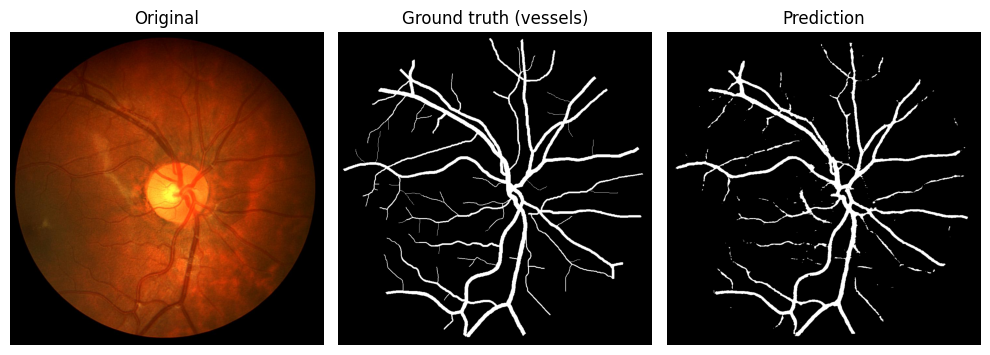

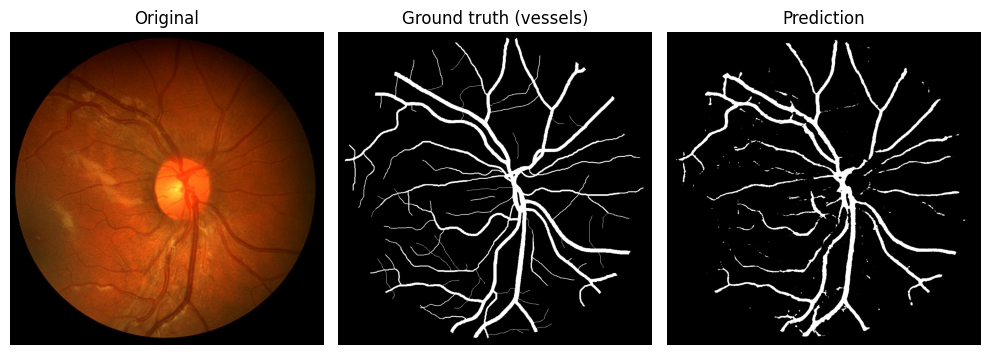

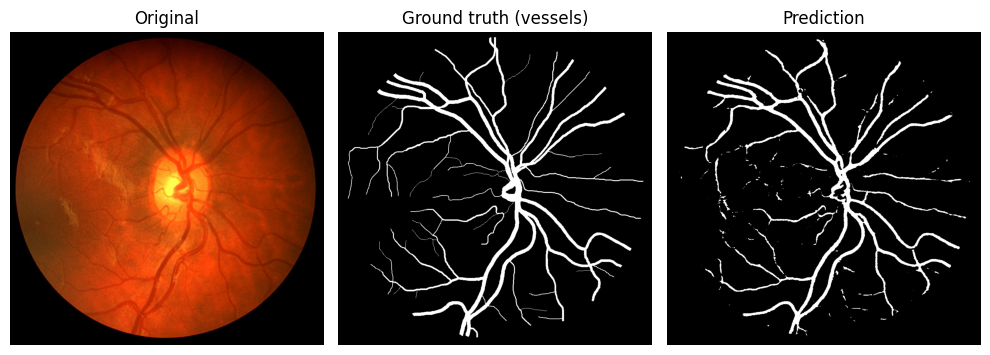

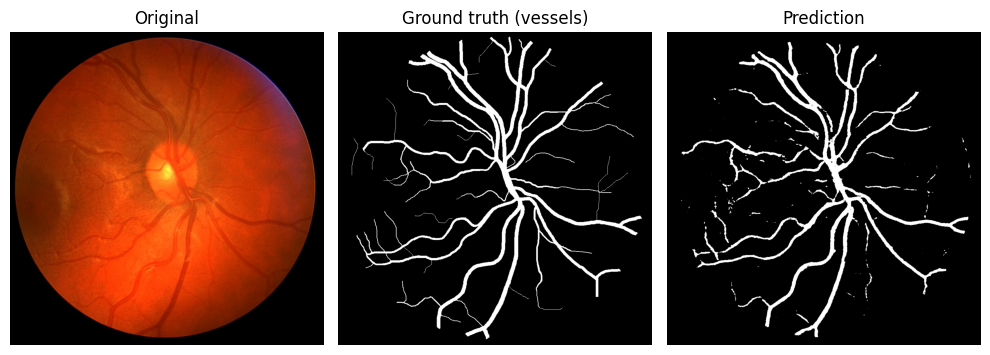

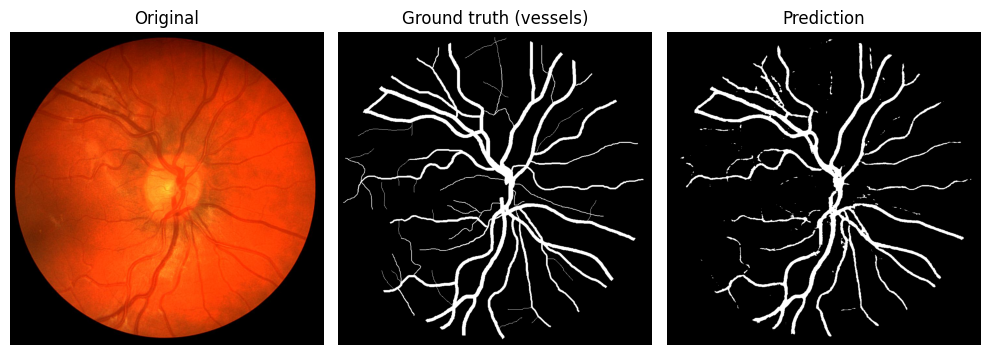

...

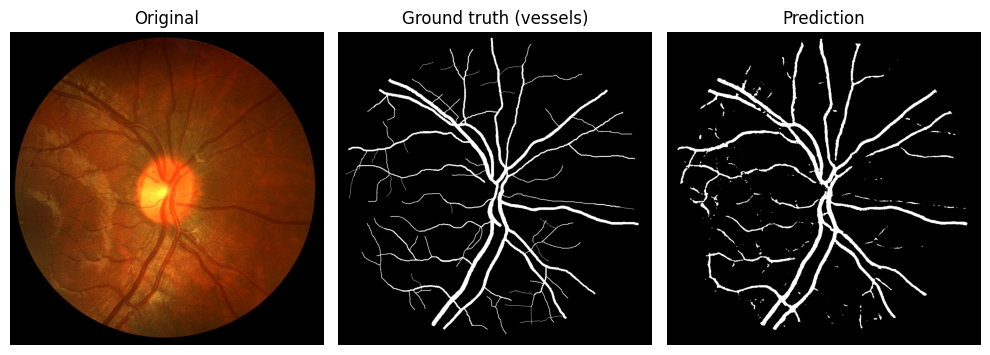

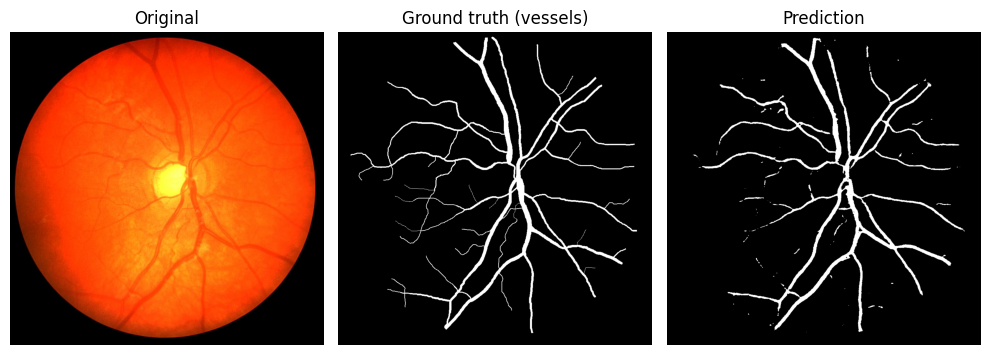

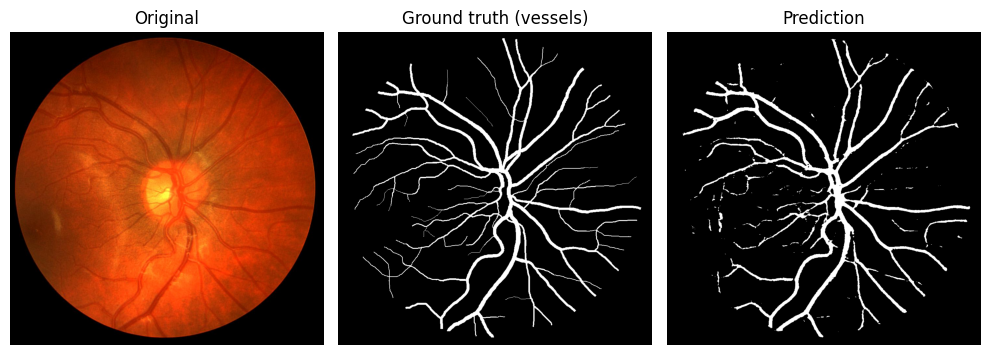

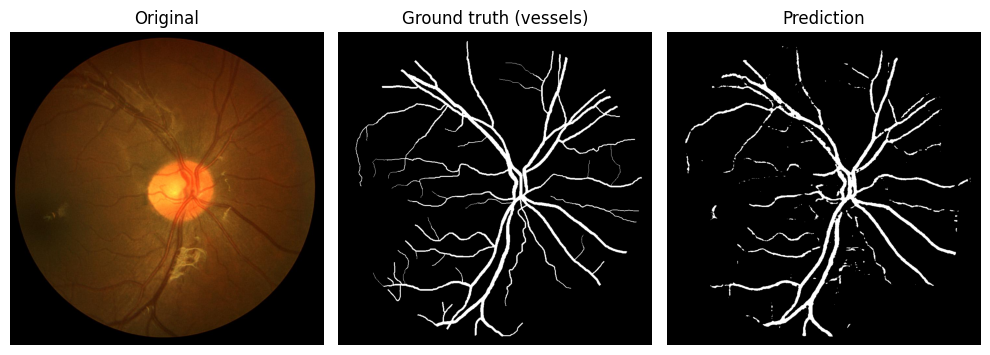

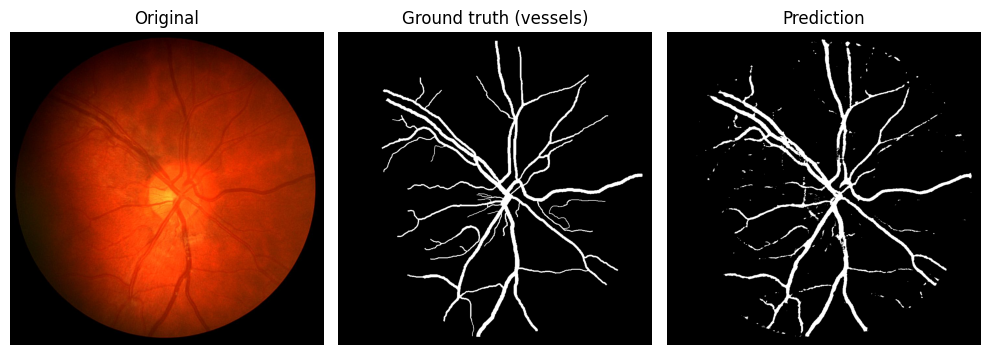

Triplets sauvegardés dans : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/predictions_test_triplets


In [42]:
model.eval()

# 📁 Dossier pour sauvegarder les triplets
pred_dir = data_dir / "predictions_test_triplets"
pred_dir.mkdir(parents=True, exist_ok=True)

img_index = 0

with torch.no_grad():
    for batch in test_loader:
        imgs   = batch["image"].to(device)  # (B,3,H,W)
        labels = batch["label"].to(device)  # (B,1,H,W)

        logits = model(imgs)                # (B,2,H,W)
        if isinstance(logits, list) :
            logits = logits[0]
        preds  = logits.argmax(dim=1)       # (B,H,W)
        targets = labels.squeeze(1)         # (B,H,W)

        for i in range(imgs.size(0)):
            img_i  = imgs[i].cpu()
            gt_i   = targets[i].cpu()
            pred_i = preds[i].cpu()

            fig, ax = plt.subplots(1, 3, figsize=(10, 4))

            ax[0].imshow(img_i.permute(1, 2, 0))
            ax[0].set_title("Original")

            ax[1].imshow(gt_i, cmap="gray")
            ax[1].set_title("Ground truth (vessels)")

            ax[2].imshow(pred_i, cmap="gray")
            ax[2].set_title("Prediction")

            for a in ax:
                a.axis("off")

            plt.tight_layout()

            save_path = pred_dir / f"test_triplet_{img_index:02d}.png"
            plt.savefig(save_path, dpi=150, bbox_inches="tight")
            plt.show()

            img_index += 1

print(f"Triplets sauvegardés dans : {pred_dir}")

#### 10.3) Curves

In [43]:
def plot_metric(train_history, val_history, key, title=None, mark_best_on="val_loss", save_folder=data_dir):
    """
    key: nom de la métrique dans les dicts (ex: "loss", "dice", "auc")

    mark_best_on:
        - "val_loss" → marquer l'epoch où val_loss est minimal
        - "val_<key>" → marquer la meilleure valeur validation pour cette métrique (max)
    """

    train = train_history.get(key, [])
    val   = val_history.get(key, [])

    if len(val) == 0:
        print(f"⚠️ Impossible de tracer '{key}' (aucune valeur de validation trouvée)")
        return

    epochs = range(1, len(val) + 1)

    plt.figure(figsize=(7, 5))
    plt.plot(epochs, train, label=f"Train {key}", linewidth=2)
    plt.plot(epochs, val,   label=f"Val {key}", linewidth=2)

    # ======== BEST POINT (scatter) =========
    if mark_best_on == "val_loss" and "loss" in val_history:
        # meilleur = minimum
        best_e = int(np.argmin(val_history["loss"])) + 1
        best_v = val[best_e - 1]
        plt.scatter([best_e], [best_v], s=80, marker="o", color="red", zorder=3,
                    label=f"best @ epoch {best_e}")

    elif mark_best_on == f"val_{key}" and len(val) > 0:
        # meilleur = maximum
        best_e = int(np.nanargmax(val)) + 1
        best_v = val[best_e - 1]
        plt.scatter([best_e], [best_v], s=80, marker="o", color="red", zorder=3,
                    label=f"best @ epoch {best_e}")

    plt.xlabel("Epoch")
    plt.ylabel(key)
    plt.title(title or f"{key} (train vs val)")
    plt.grid(True)
    plt.legend()

    save_path = save_folder / f"{key}.png"
    plt.savefig(save_path, dpi=200, bbox_inches="tight")
    print(f"💾 Courbe sauvegardée : {save_path}")

    plt.show()

💾 Courbe sauvegardée : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/loss.png


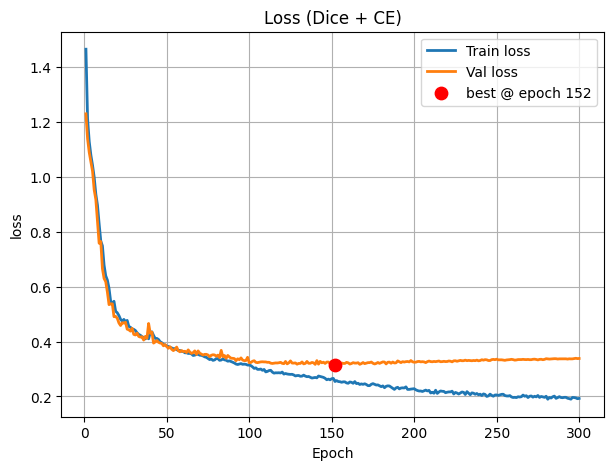

💾 Courbe sauvegardée : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/dice.png


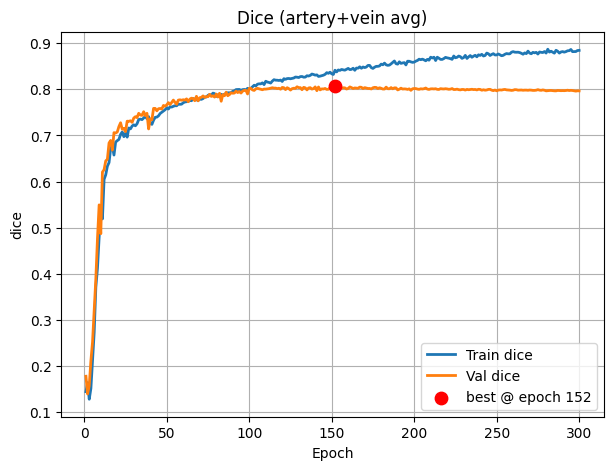

💾 Courbe sauvegardée : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/auc.png


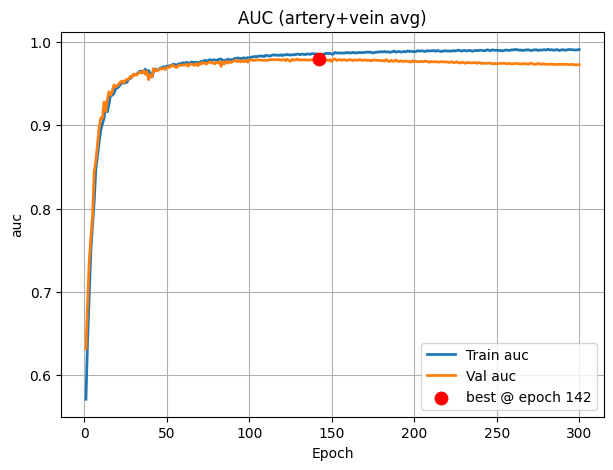

In [44]:
# Loss totale, Dice, AUC : même type de visualisation que dans ton notebook

plot_metric(train_history, val_history, "loss",
            title="Loss (Dice + CE)", mark_best_on="val_loss")

plot_metric(train_history, val_history, "dice",
            title="Dice (artery+vein avg)", mark_best_on="val_dice")

plot_metric(train_history, val_history, "auc",
            title="AUC (artery+vein avg)", mark_best_on="val_auc")

#### 10.3) Table of metrics

In [45]:
# ==== Évaluation globale sur le test ====

model.eval()

conf_sums_test = init_confmat_sums(num_classes=NUM_CLASSES)
auc_buf_test   = init_auc_buffers(classes=[VESSEL_CLASS])

with torch.no_grad():
    for batch in test_loader:
        imgs   = batch["image"].to(device)
        labels = batch["label"].to(device)   # (B,1,H,W)

        logits = model(imgs)
        if isinstance(logits, list) :
            logits = logits[0]                 # (B,2,H,W)
        preds  = logits.argmax(dim=1)        # (B,H,W)
        targets = labels.squeeze(1)          # (B,H,W)

        update_confmat_sums(conf_sums_test, preds, targets, NUM_CLASSES)
        update_auc_buffers(auc_buf_test, logits, targets)

vessel_metrics = compute_scalar_metrics_from_confmat(conf_sums_test, include_classes=[VESSEL_CLASS])
vessel_auc     = compute_mean_auc(auc_buf_test)

results = {
    "Vessel": {
        "accuracy":    vessel_metrics["accuracy"],
        "precision":   vessel_metrics["precision"],
        "recall":      vessel_metrics["recall"],
        "specificity": vessel_metrics["specificity"],
        "dice":        vessel_metrics["dice"],
        "IoU":         vessel_metrics["iou"],
        "AUC":         vessel_auc,
    }
}

df_global = pd.DataFrame(results).T.round(4)

print("\n=== Résultats globaux sur le test (FOV uniquement) ===\n")
display(df_global)

# Sauvegarde en CSV / JSON
metrics_csv_path  = data_dir / "metrics_global_test.csv"
metrics_json_path = data_dir / "metrics_global_test.json"

df_global.to_csv(metrics_csv_path)
df_global.to_json(metrics_json_path, orient="index")

print("→ Sauvegardé :")
print("  ", metrics_csv_path)
print("  ", metrics_json_path)

/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f


=== Résultats globaux sur le test (FOV uniquement) ===



,accuracy,precision,recall,specificity,dice,IoU,AUC
Vessel,0.9686,0.7929,0.7626,0.9846,0.7775,0.636,0.9754


→ Sauvegardé :
   /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/metrics_global_test.csv
   /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/metrics_global_test.json


#### 10.4) Comparaison of the images

/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

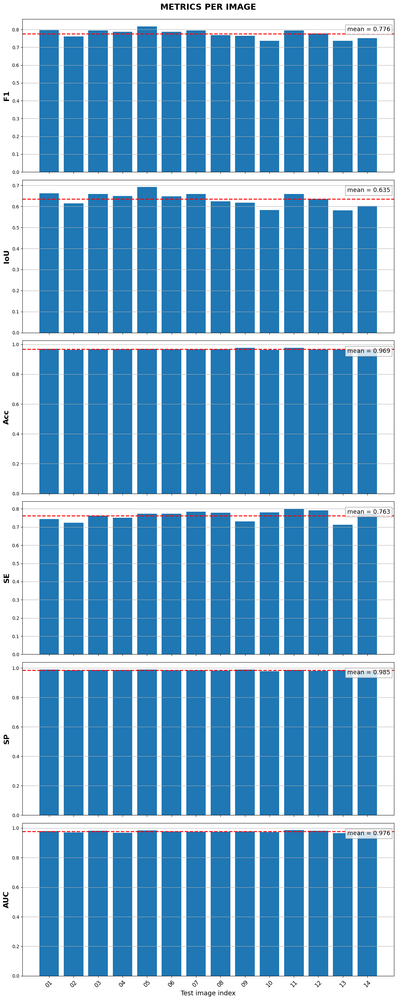

Sauvegardé : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/per_image_metrics.png


In [46]:
# ==========================================================
#   Comparison of the images — Standalone (NO FOV version)
#   Fusion of the 3 original cells — produces final figure
# ==========================================================

# ---- HELPER FUNCTIONS ----

def confusion_binary(pred_bin: torch.Tensor, gt_bin: torch.Tensor):
    pred_bin = pred_bin.bool()
    gt_bin   = gt_bin.bool()
    TP = (pred_bin & gt_bin).sum().item()
    FP = (pred_bin & ~gt_bin).sum().item()
    FN = (~pred_bin & gt_bin).sum().item()
    TN = (~pred_bin & ~gt_bin).sum().item()
    return TP, FP, FN, TN


def metrics_from_conf(TP, FP, FN, TN):
    eps = 1e-7
    Acc  = (TP + TN) / max(TP + TN + FP + FN, eps)
    SE   = TP / max(TP + FN, eps)
    SP   = TN / max(TN + FP, eps)
    Prec = TP / max(TP + FP, eps)
    F1   = 2 * Prec * SE / max(Prec + SE, eps)
    IoU  = TP / max(TP + FP + FN, eps)
    return F1, IoU, Acc, SE, SP


def auc_from_logits_one_class(logits_1img, gt_1img, cls):
    with torch.no_grad():
        probs = F.softmax(logits_1img.unsqueeze(0), dim=1)[0]
        prob_cls = probs[cls]

        y_score = prob_cls.view(-1).cpu().numpy()
        y_true  = (gt_1img.view(-1) == cls).cpu().numpy().astype(np.uint8)

        if (y_true == 1).sum() == 0 or (y_true == 0).sum() == 0:
            return float("nan")

        try:
            return float(roc_auc_score(y_true, y_score))
        except:
            return float("nan")


# ==========================================================
#               METRICS PER IMAGE — FULL IMAGE ONLY
# ==========================================================

model.eval()

metric_names = ["F1", "IoU", "Acc", "SE", "SP", "AUC"]
scores_full = {m: [] for m in metric_names}

img_indices = []

with torch.no_grad():
    current_idx = 0
    for batch in test_loader:
        imgs   = batch["image"].to(device)
        labels = batch["label"].to(device)

        logits  = model(imgs)
        if isinstance(logits, list) :
            logits = logits[0]
        preds   = logits.argmax(dim=1)
        targets = labels.squeeze(1)

        for i in range(imgs.size(0)):
            gt_i   = targets[i]
            pred_i = preds[i]
            log_i  = logits[i]

            pred_v = (pred_i == VESSEL_CLASS)
            gt_v   = (gt_i == VESSEL_CLASS)

            TP, FP, FN, TN = confusion_binary(pred_v, gt_v)
            F1, IoU, Acc, SE, SP = metrics_from_conf(TP, FP, FN, TN)
            AUC = auc_from_logits_one_class(log_i, gt_i, VESSEL_CLASS)

            scores_full["F1"].append(F1)
            scores_full["IoU"].append(IoU)
            scores_full["Acc"].append(Acc)
            scores_full["SE"].append(SE)
            scores_full["SP"].append(SP)
            scores_full["AUC"].append(AUC)

            img_indices.append(current_idx)
            current_idx += 1

# ==========================================================
#               FINAL FIGURE (SAME AS LAST CELL)
#           BUT SINGLE COLUMN (NO FOV IN DATASET)
# ==========================================================

metric_names = ["F1", "IoU", "Acc", "SE", "SP", "AUC"]

fig, axes = plt.subplots(
    nrows=6, ncols=1, figsize=(12, 30), sharex=True
)

axes = axes.ravel()

axes[0].set_title("METRICS PER IMAGE", fontsize=18, fontweight="bold", pad=20)

for row, m in enumerate(metric_names):

    vals = np.array(scores_full[m], dtype=float)
    mean_val = np.nanmean(vals)

    ax = axes[row]
    ax.bar(np.arange(len(vals)), vals)
    ax.axhline(mean_val, color="red", linestyle="--", linewidth=2)

    ax.text(
        0.99, 0.92,
        f"mean = {mean_val:.3f}",
        transform=ax.transAxes,
        horizontalalignment="right",
        fontsize=13,
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="gray")
    )

    ax.set_ylabel(m, fontsize=16, fontweight="bold")
    ax.grid(True, axis="y")


axes[-1].set_xticks(np.arange(len(vals)))
axes[-1].set_xticklabels(
    [f"{i+1:02d}" for i in range(len(vals))],
    rotation=45,
    fontsize=12
)
axes[-1].set_xlabel("Test image index", fontsize=14)

plt.tight_layout()

out_path = data_dir / "per_image_metrics.png"
plt.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()

print(f"Sauvegardé : {out_path}")


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

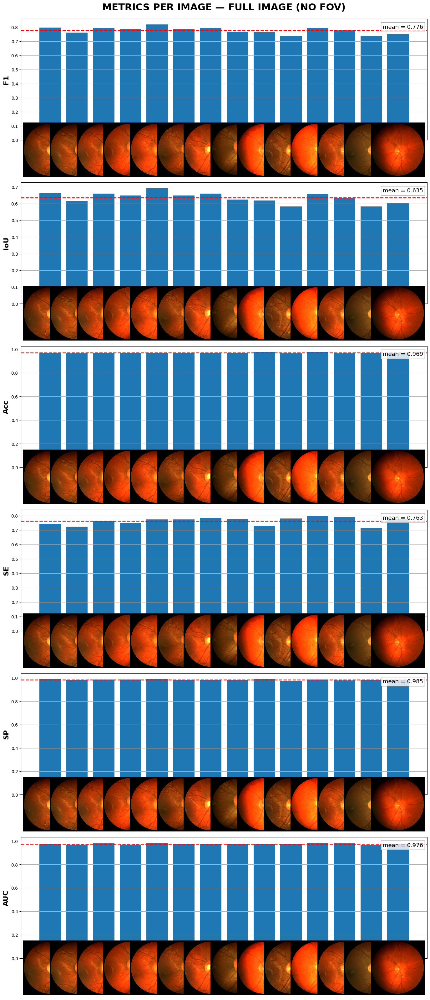

Sauvegardé : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/per_image_metrics_FULLIMAGE_with_thumbnails.png


In [47]:
# ==========================================================
#   Comparison of the images — Standalone (NO FOV)
#   + Images below histogram bars
# ==========================================================

# ---- HELPER FUNCTIONS ----

def confusion_binary(pred_bin: torch.Tensor, gt_bin: torch.Tensor):
    pred_bin = pred_bin.bool()
    gt_bin   = gt_bin.bool()
    TP = (pred_bin & gt_bin).sum().item()
    FP = (pred_bin & ~gt_bin).sum().item()
    FN = (~pred_bin & gt_bin).sum().item()
    TN = (~pred_bin & ~gt_bin).sum().item()
    return TP, FP, FN, TN


def metrics_from_conf(TP, FP, FN, TN):
    eps = 1e-7
    Acc  = (TP + TN) / max(TP + TN + FP + FN, eps)
    SE   = TP / max(TP + FN, eps)
    SP   = TN / max(TN + FP, eps)
    Prec = TP / max(TP + FP, eps)
    F1   = 2 * Prec * SE / max(Prec + SE, eps)
    IoU  = TP / max(TP + FP + FN, eps)
    return F1, IoU, Acc, SE, SP


def auc_from_logits_one_class(logits_1img, gt_1img, cls):
    with torch.no_grad():
        probs = F.softmax(logits_1img.unsqueeze(0), dim=1)[0]
        prob_cls = probs[cls]

        y_score = prob_cls.view(-1).cpu().numpy()
        y_true  = (gt_1img.view(-1) == cls).cpu().numpy().astype(np.uint8)

        if (y_true == 1).sum() == 0 or (y_true == 0).sum() == 0:
            return float("nan")

        try:
            return float(roc_auc_score(y_true, y_score))
        except:
            return float("nan")


# ==========================================================
#               METRICS PER IMAGE — FULL IMAGE ONLY
# ==========================================================

model.eval()

metric_names = ["F1", "IoU", "Acc", "SE", "SP", "AUC"]
scores_full = {m: [] for m in metric_names}
img_indices = []
all_images = []  # stockage des images brutes pour affichage

with torch.no_grad():
    current_idx = 0
    for batch in test_loader:
        imgs   = batch["image"].to(device)
        labels = batch["label"].to(device)

        logits  = model(imgs)
        if isinstance(logits, list) :
            logits = logits[0]
        preds   = logits.argmax(dim=1)
        targets = labels.squeeze(1)

        for i in range(imgs.size(0)):
            gt_i   = targets[i]
            pred_i = preds[i]
            log_i  = logits[i]

            # Sauvegarde image originale pour affichage
            all_images.append(imgs[i].cpu().permute(1, 2, 0).numpy())

            pred_v = (pred_i == VESSEL_CLASS)
            gt_v   = (gt_i == VESSEL_CLASS)

            TP, FP, FN, TN = confusion_binary(pred_v, gt_v)
            F1, IoU, Acc, SE, SP = metrics_from_conf(TP, FP, FN, TN)
            AUC = auc_from_logits_one_class(log_i, gt_i, VESSEL_CLASS)

            scores_full["F1"].append(F1)
            scores_full["IoU"].append(IoU)
            scores_full["Acc"].append(Acc)
            scores_full["SE"].append(SE)
            scores_full["SP"].append(SP)
            scores_full["AUC"].append(AUC)

            img_indices.append(current_idx)
            current_idx += 1

# ==========================================================
#                FINAL FIGURE WITH IMAGES UNDER BARS
# ==========================================================

metric_names = ["F1", "IoU", "Acc", "SE", "SP", "AUC"]

fig, axes = plt.subplots(
    nrows=6, ncols=1, figsize=(14, 32), sharex=True
)

axes = axes.ravel()

axes[0].set_title("METRICS PER IMAGE — FULL IMAGE (NO FOV)", fontsize=22, fontweight="bold", pad=20)

n_images = len(all_images)
x = np.arange(n_images)

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def add_image_under_bar(ax, img, xpos, y_bottom):
    imagebox = OffsetImage(img, zoom=0.13)
    ab = AnnotationBbox(imagebox, (xpos, y_bottom - 0.08),
                        xycoords=("data", "axes fraction"),
                        frameon=False)
    ax.add_artist(ab)

for row, m in enumerate(metric_names):

    vals = np.array(scores_full[m], dtype=float)
    mean_val = np.nanmean(vals)

    ax = axes[row]
    bars = ax.bar(x, vals)

    # Ligne de moyenne
    ax.axhline(mean_val, color="red", linestyle="--", linewidth=2)
    ax.text(
        0.99, 0.92,
        f"mean = {mean_val:.3f}",
        transform=ax.transAxes,
        horizontalalignment="right",
        fontsize=13,
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="gray")
    )

    # Ajout des images sous chaque barre
    for j in range(n_images):
        img = all_images[j]
        add_image_under_bar(ax, img, j, 0)

    ax.set_ylabel(m, fontsize=16, fontweight="bold")
    ax.grid(True, axis="y")

axes[-1].set_xticks(x)
axes[-1].set_xticklabels([f"{i+1:02d}" for i in x], rotation=45, fontsize=12)
axes[-1].set_xlabel("Test image index", fontsize=14)

plt.tight_layout()

out_path = data_dir / "per_image_metrics_FULLIMAGE_with_thumbnails.png"
plt.savefig(out_path, dpi=200, bbox_inches="tight")
plt.show()

print(f"Sauvegardé : {out_path}")


/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /pytorch/torch/csrc/utils/tensor_numpy.cpp:206.)
  return torch.as_tensor(x, *args, **_kwargs).as_subclass(cls)
/home/usrs/hnoel/miniconda3/envs/monai/lib/python3.10/site-packages/monai/data/meta_tensor.py:117: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed f

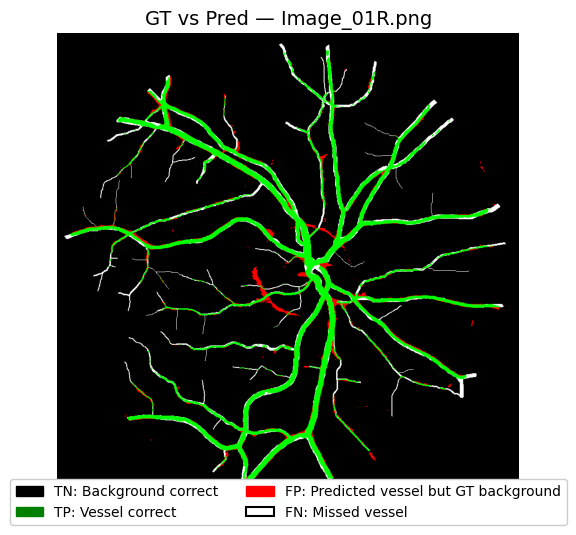

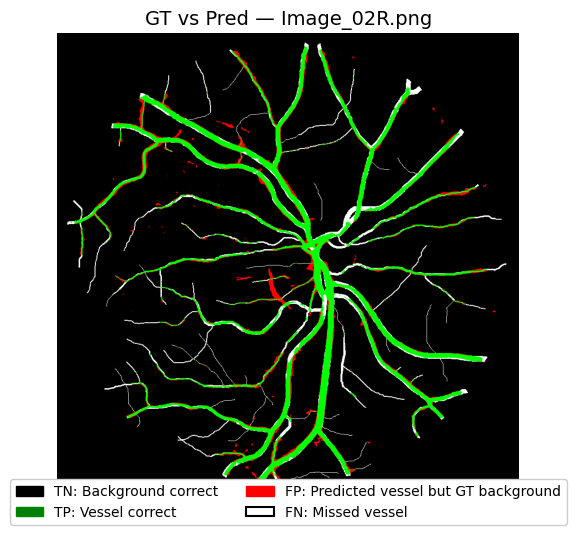

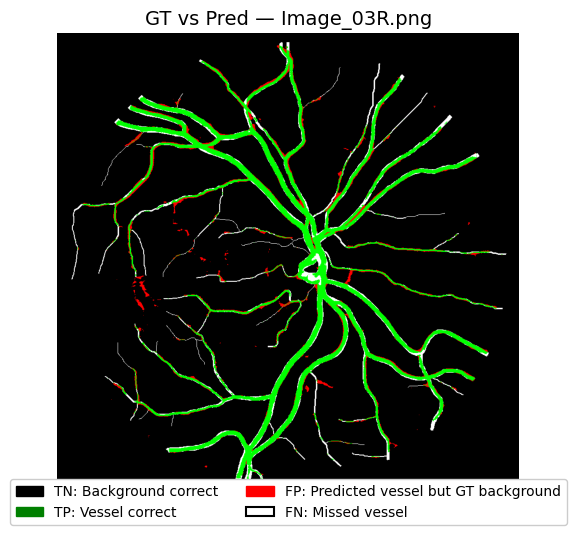

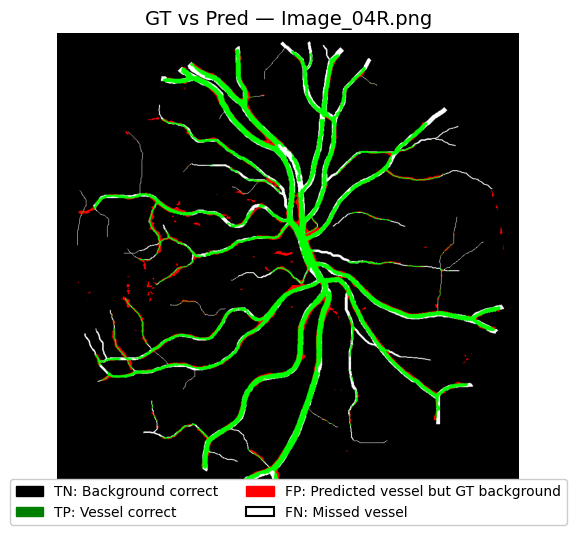

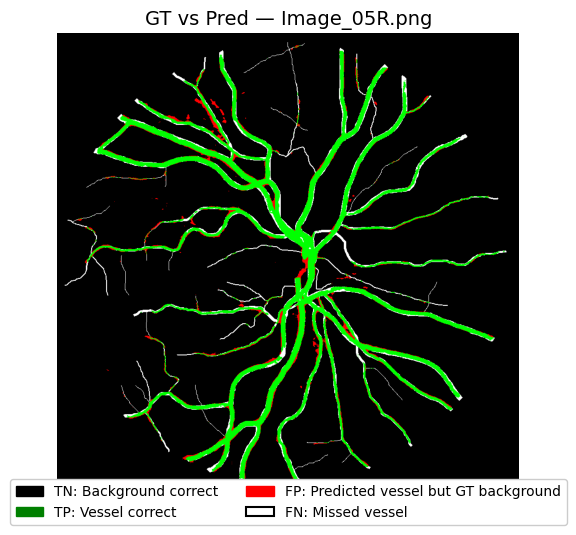

...

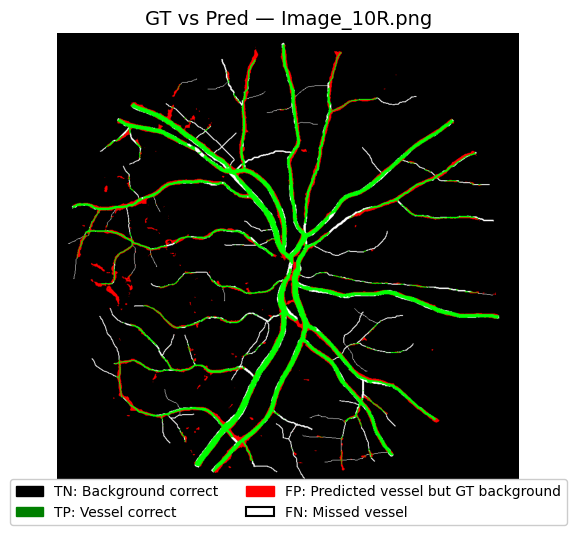

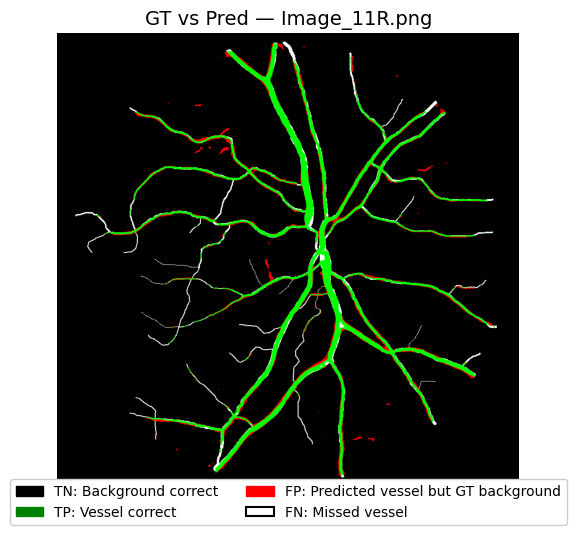

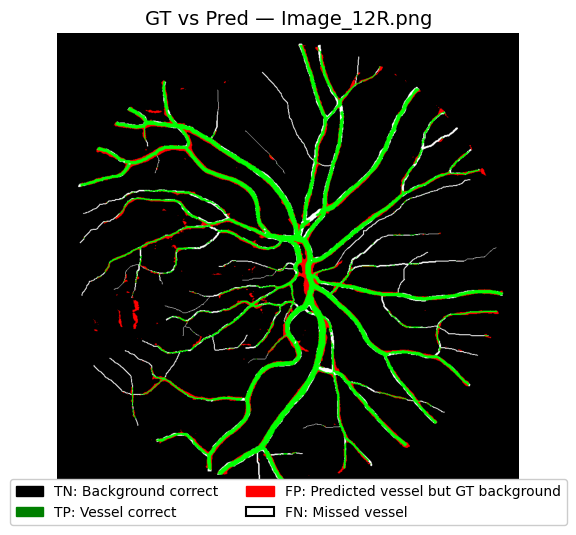

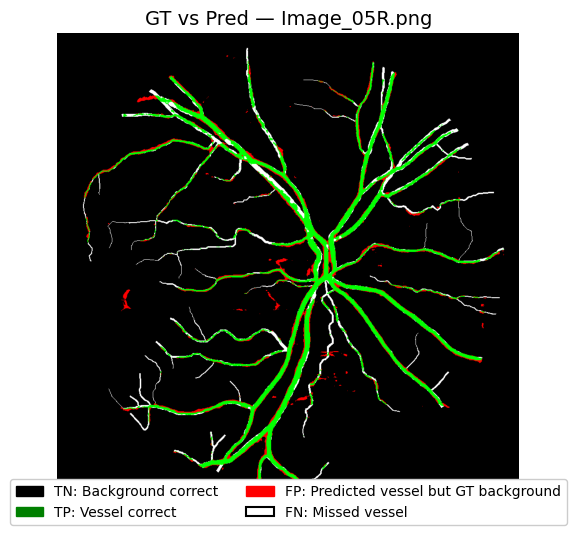

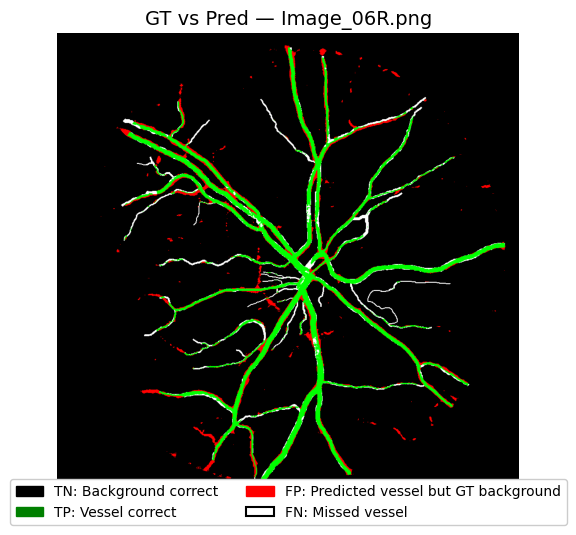

Overlays enregistrés dans : /home/usrs/hnoel/Tohoku/Monai/UNet/UNet_CHASE_DB1_v1/overlays_test


In [48]:
# ==========================================================
#   Overlay GT vs Pred — With legend, filenames, saving
# ==========================================================

model.eval()

# 📁 Dossier pour sauvegarder les overlays
overlay_dir = data_dir / "overlays_test"
overlay_dir.mkdir(parents=True, exist_ok=True)

# Pour récupérer le nom réel des fichiers test (triés)
test_img_paths = sorted(list(test_images_dir.glob("*.png")))

with torch.no_grad():
    for idx, batch in enumerate(test_loader):
        imgs    = batch["image"].to(device)      # (B,3,H,W)
        labels  = batch["label"].to(device)      # (B,1,H,W)
        logits  = model(imgs)
        if isinstance(logits, list) :
            logits = logits[0]
        preds   = logits.argmax(dim=1)
        targets = labels.squeeze(1)

        batch_size = imgs.size(0)

        for i in range(batch_size):

            # Récupérer nom réel du fichier
            global_index = idx * batch_size + i
            img_name = test_img_paths[global_index].name

            # Tensors -> numpy
            gt  = (targets[i].cpu().numpy() == VESSEL_CLASS).astype(np.uint8)
            pr  = (preds[i].cpu().numpy()    == VESSEL_CLASS).astype(np.uint8)
            H, W = gt.shape

            # Overlay RGB
            overlay = np.zeros((H, W, 3), dtype=float)

            # TN (0,0) → noir
            mask_tn = (gt == 0) & (pr == 0)
            overlay[mask_tn] = [0, 0, 0]

            # TP (1,1) → vert
            mask_tp = (gt == 1) & (pr == 1)
            overlay[mask_tp] = [0, 1, 0]

            # FP (0,1) → rouge
            mask_fp = (gt == 0) & (pr == 1)
            overlay[mask_fp] = [1, 0, 0]

            # FN (1,0) → blanc
            mask_fn = (gt == 1) & (pr == 0)
            overlay[mask_fn] = [1, 1, 1]

            # ======== FIGURE ========
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(overlay)
            ax.axis("off")
            ax.set_title(f"GT vs Pred — {img_name}", fontsize=14)

            # ======== LÉGENDE ========
            # On crée une "fake" légende avec des patches colorés
            import matplotlib.patches as mpatches
            legend_elems = [
                mpatches.Patch(color="black", label="TN: Background correct"),
                mpatches.Patch(color="green", label="TP: Vessel correct"),
                mpatches.Patch(color="red",   label="FP: Predicted vessel but GT background"),
                mpatches.Patch(facecolor="white", edgecolor="black", linewidth=1.5, label="FN: Missed vessel")
,
            ]
            ax.legend(handles=legend_elems, loc="lower center",
                      bbox_to_anchor=(0.5, -0.08),
                      fancybox=True, framealpha=1,
                      ncol=2)

            # ======== SAUVEGARDE ========
            save_path = overlay_dir / f"overlay_{global_index:02d}.png"
            plt.savefig(save_path, dpi=200, bbox_inches="tight")
            plt.show()

print(f"Overlays enregistrés dans : {overlay_dir}")
